# Generative Adversarial Networks (GANs)


### What is a GAN?

In 2014, [Goodfellow et al.](https://arxiv.org/abs/1406.2661) presented a method for training generative models called Generative Adversarial Networks (GANs for short). In a GAN, we build two different neural networks. Our first network is a traditional classification network, called the **discriminator**. We will train the discriminator to take images, and classify them as being real (belonging to the training set) or fake (not present in the training set). Our other network, called the **generator**, will take random noise as input and transform it using a neural network to produce images. The goal of the generator is to fool the discriminator into thinking the images it produced are real.

We can think of this back and forth process of the generator ($G$) trying to fool the discriminator ($D$), and the discriminator trying to correctly classify real vs. fake as a minimax game:
$$\underset{G}{\text{minimize}}\; \underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
where $x \sim p_\text{data}$ are samples from the input data, $z \sim p(z)$ are the random noise samples, $G(z)$ are the generated images using the neural network generator $G$, and $D$ is the output of the discriminator, specifying the probability of an input being real. In [Goodfellow et al.](https://arxiv.org/abs/1406.2661), they analyze this minimax game and show how it relates to minimizing the Jensen-Shannon divergence between the training data distribution and the generated samples from $G$.

To optimize this minimax game, we will aternate between taking gradient *descent* steps on the objective for $G$, and gradient *ascent* steps on the objective for $D$:
1. update the **generator** ($G$) to minimize the probability of the __discriminator making the correct choice__. 
2. update the **discriminator** ($D$) to maximize the probability of the __discriminator making the correct choice__.

While these updates are useful for analysis, they do not perform well in practice. Instead, we will use a different objective when we update the generator: maximize the probability of the **discriminator making the incorrect choice**. This small change helps to allevaiate problems with the generator gradient vanishing when the discriminator is confident. This is the standard update used in most GAN papers, and was used in the original paper from [Goodfellow et al.](https://arxiv.org/abs/1406.2661). 

In this assignment, we will alternate the following updates:
1. Update the generator ($G$) to maximize the probability of the discriminator making the incorrect choice on generated data:
$$\underset{G}{\text{maximize}}\;  \mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
2. Update the discriminator ($D$), to maximize the probability of the discriminator making the correct choice on real and generated data:
$$\underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$

### What else is there?
Since 2014, GANs have exploded into a huge research area, with massive [workshops](https://sites.google.com/site/nips2016adversarial/), and [hundreds of new papers](https://github.com/hindupuravinash/the-gan-zoo). Compared to other approaches for generative models, they often produce the highest quality samples but are some of the most difficult and finicky models to train (see [this github repo](https://github.com/soumith/ganhacks) that contains a set of 17 hacks that are useful for getting models working). Improving the stabiilty and robustness of GAN training is an open research question, with new papers coming out every day! For a more recent tutorial on GANs, see [here](https://arxiv.org/abs/1701.00160). There is also some even more recent exciting work that changes the objective function to Wasserstein distance and yields much more stable results across model architectures: [WGAN](https://arxiv.org/abs/1701.07875), [WGAN-GP](https://arxiv.org/abs/1704.00028).


GANs are not the only way to train a generative model! For other approaches to generative modeling check out the [deep generative model chapter](http://www.deeplearningbook.org/contents/generative_models.html) of the Deep Learning [book](http://www.deeplearningbook.org). Another popular way of training neural networks as generative models is Variational Autoencoders (co-discovered [here](https://arxiv.org/abs/1312.6114) and [here](https://arxiv.org/abs/1401.4082)). Variational autoencoders combine neural networks with variational inference to train deep generative models. These models tend to be far more stable and easier to train but currently don't produce samples that are as pretty as GANs.

Example pictures of what you should expect (yours might look slightly different):

![caption](gan_outputs_tf.png)


## Setup

In [1]:
import tensorflow as tf
import numpy as np
import os

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# A bunch of utility functions

def show_images(images):
    images = np.reshape(images, [images.shape[0], -1])  # images reshape to (batch_size, D)
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))

    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img.reshape([sqrtimg,sqrtimg]))
    return

def preprocess_img(x):
    return 2 * x - 1.0

def deprocess_img(x):
    return (x + 1.0) / 2.0

def rel_error(x,y):
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

def count_params(model):
    """Count the number of parameters in the current TensorFlow graph """
    param_count = np.sum([np.prod(p.shape) for p in model.weights])
    return param_count

answers = np.load('gan-checks-tf.npz')

NOISE_DIM = 96

## Dataset
 GANs are notoriously finicky with hyperparameters, and also require many training epochs. In order to make this assignment approachable without a GPU, we will be working on the MNIST dataset, which is 60,000 training and 10,000 test images. Each picture contains a centered image of white digit on black background (0 through 9). This was one of the first datasets used to train convolutional neural networks and it is fairly easy -- a standard CNN model can easily exceed 99% accuracy. 
 

**Heads-up**: Our MNIST wrapper returns images as vectors. That is, they're size (batch, 784). If you want to treat them as images, we have to resize them to (batch,28,28) or (batch,28,28,1). They are also type np.float32 and bounded [0,1]. 

In [2]:
class MNIST(object):
    def __init__(self, batch_size, shuffle=False):
        """
        Construct an iterator object over the MNIST data
        
        Inputs:
        - batch_size: Integer giving number of elements per minibatch
        - shuffle: (optional) Boolean, whether to shuffle the data on each epoch
        """
        train, _ = tf.keras.datasets.mnist.load_data()
        X, y = train
        X = X.astype(np.float32)/255
        X = X.reshape((X.shape[0], -1))
        self.X, self.y = X, y
        self.batch_size, self.shuffle = batch_size, shuffle

    def __iter__(self):
        N, B = self.X.shape[0], self.batch_size
        idxs = np.arange(N)
        if self.shuffle:
            np.random.shuffle(idxs)
        return iter((self.X[i:i+B], self.y[i:i+B]) for i in range(0, N, B)) 

11490434/11490434 [==============================] - 4s 0us/step


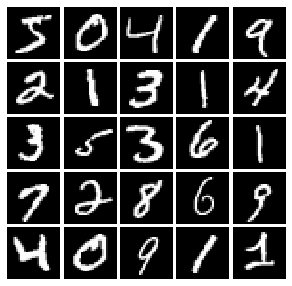

In [3]:
# show a batch
mnist = MNIST(batch_size=25) 
show_images(mnist.X[:25])

## LeakyReLU
In the cell below, you should implement a LeakyReLU. See the [class notes](http://cs231n.github.io/neural-networks-1/) (where alpha is small number) or equation (3) in [this paper](http://ai.stanford.edu/~amaas/papers/relu_hybrid_icml2013_final.pdf). LeakyReLUs keep ReLU units from dying and are often used in GAN methods (as are maxout units, however those increase model size and therefore are not used in this notebook).

HINT: You should be able to use `tf.maximum`

In [4]:
def leaky_relu(x, alpha=0.01):
    """Compute the leaky ReLU activation function.
    
    Inputs:
    - x: TensorFlow Tensor with arbitrary shape
    - alpha: leak parameter for leaky ReLU
    
    Returns:
    TensorFlow Tensor with the same shape as x
    """
    # TODO: implement leaky ReLU
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    x = tf.nn.leaky_relu(x,alpha)
    return x
    pass

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Test your leaky ReLU implementation. You should get errors < 1e-10

In [5]:
def test_leaky_relu(x, y_true):
    y = leaky_relu(tf.constant(x))
    print('Maximum error: %g'%rel_error(y_true, y))

test_leaky_relu(answers['lrelu_x'], answers['lrelu_y'])

Maximum error: 1.11759e-08


## Random Noise
Generate a TensorFlow `Tensor` containing uniform noise from -1 to 1 with shape `[batch_size, dim]`.

In [6]:
def sample_noise(batch_size, dim):
    """Generate random uniform noise from -1 to 1.
    
    Inputs:
    - batch_size: integer giving the batch size of noise to generate
    - dim: integer giving the dimension of the noise to generate
    
    Returns:
    TensorFlow Tensor containing uniform noise in [-1, 1] with shape [batch_size, dim]
    """
    # TODO: sample and return noise
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    noise = tf.random.uniform([batch_size,dim],minval = -1,maxval = 1)
    return noise
    pass

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Make sure noise is the correct shape and type:

In [7]:
def test_sample_noise():
    batch_size = 3
    dim = 4
    z = sample_noise(batch_size, dim)
    # Check z has the correct shape
    assert z.get_shape().as_list() == [batch_size, dim]
    # Make sure z is a Tensor and not a numpy array
    assert isinstance(z, tf.Tensor)
    # Check that we get different noise for different evaluations
    z1 = sample_noise(batch_size, dim)
    z2 = sample_noise(batch_size, dim)
    assert not np.array_equal(z1, z2)
    # Check that we get the correct range
    assert np.all(z1 >= -1.0) and np.all(z1 <= 1.0)
    print("All tests passed!")
    
test_sample_noise()

All tests passed!


## Discriminator
Our first step is to build a discriminator. **Hint:** You should use the layers in `tf.keras.layers` to build the model.
All fully connected layers should include bias terms. For initialization, just use the default initializer used by the `tf.keras.layers` functions.

Architecture:
 * Fully connected layer with input size 784 and output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 1 
 
The output of the discriminator should thus have shape `[batch_size, 1]`, and contain real numbers corresponding to the scores that each of the `batch_size` inputs is a real image.

In [8]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.InputLayer(784),
        tf.keras.layers.Dense(256),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.Dense(256),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.Dense(1)
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the discriminator is correct:

In [9]:
def test_discriminator(true_count=267009):
    model = discriminator()
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in discriminator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in discriminator.')
        
test_discriminator()

Correct number of parameters in discriminator.


## Generator
Now to build a generator. You should use the layers in `tf.keras.layers` to construct the model. All fully connected layers should include bias terms. Note that you can use the tf.nn module to access activation functions. Once again, use the default initializers for parameters.

Architecture:
 * Fully connected layer with inupt size tf.shape(z)[1] (the number of noise dimensions) and output size 1024
 * `ReLU`
 * Fully connected layer with output size 1024 
 * `ReLU`
 * Fully connected layer with output size 784
 * `TanH` (To restrict every element of the output to be in the range [-1,1])

In [10]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.InputLayer(noise_dim),
        tf.keras.layers.Dense(1024),
        tf.keras.layers.ReLU(),
        tf.keras.layers.Dense(1024),
        tf.keras.layers.ReLU(),
        tf.keras.layers.Dense(784,activation = tf.nn.tanh)
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the generator is correct:

In [11]:
def test_generator(true_count=1858320):
    model = generator(4)
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in generator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in generator.')
        
test_generator()

Correct number of parameters in generator.


# GAN Loss

Compute the generator and discriminator loss. The generator loss is:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

**HINTS**: Use [tf.ones](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/ones) and [tf.zeros](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/zeros) to generate labels for your discriminator. Use [tf.keras.losses.BinaryCrossentropy](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/losses/BinaryCrossentropy) to help compute your loss function.

In [12]:
def discriminator_loss(logits_real, logits_fake):
    """
    Computes the discriminator loss described above.
    
    Inputs:
    - logits_real: Tensor of shape (N, 1) giving scores for the real data.
    - logits_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Returns:
    - loss: Tensor containing (scalar) the loss for the discriminator.
    """
    loss = None
    cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    real_loss = cross_entropy(tf.ones_like(logits_real), logits_real)
    fake_loss = cross_entropy(tf.zeros_like(logits_fake), logits_fake)
    loss = real_loss + fake_loss
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def generator_loss(logits_fake):
    """
    Computes the generator loss described above.

    Inputs:
    - logits_fake: PyTorch Tensor of shape (N,) giving scores for the fake data.
    
    Returns:
    - loss: PyTorch Tensor containing the (scalar) loss for the generator.
    """
    loss = None
    cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    loss = cross_entropy(tf.ones_like(logits_fake), logits_fake)
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your GAN loss. Make sure both the generator and discriminator loss are correct. You should see errors less than 1e-8.

In [13]:
def test_discriminator_loss(logits_real, logits_fake, d_loss_true):
    d_loss = discriminator_loss(tf.constant(logits_real),
                                tf.constant(logits_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))

test_discriminator_loss(answers['logits_real'], answers['logits_fake'],
                        answers['d_loss_true'])

Maximum error in d_loss: 0


In [14]:
def test_generator_loss(logits_fake, g_loss_true):
    g_loss = generator_loss(tf.constant(logits_fake))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_generator_loss(answers['logits_fake'], answers['g_loss_true'])

Maximum error in g_loss: 7.19722e-17


# Optimizing our loss
Make an `Adam` optimizer with a 1e-3 learning rate, beta1=0.5 to mininize G_loss and D_loss separately. The trick of decreasing beta was shown to be effective in helping GANs converge in the [Improved Techniques for Training GANs](https://arxiv.org/abs/1606.03498) paper. In fact, with our current hyperparameters, if you set beta1 to the Tensorflow default of 0.9, there's a good chance your discriminator loss will go to zero and the generator will fail to learn entirely. In fact, this is a common failure mode in GANs; if your D(x) learns too fast (e.g. loss goes near zero), your G(z) is never able to learn. Often D(x) is trained with SGD with Momentum or RMSProp instead of Adam, but here we'll use Adam for both D(x) and G(z). 

In [15]:
# TODO: create an AdamOptimizer for D_solver and G_solver
def get_solvers(learning_rate=1e-3, beta1=0.5):
    """Create solvers for GAN training.
    
    Inputs:
    - learning_rate: learning rate to use for both solvers
    - beta1: beta1 parameter for both solvers (first moment decay)
    
    Returns:
    - D_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    - G_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    """
    D_solver = None
    G_solver = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    D_solver = tf.optimizers.Adam(learning_rate,beta1)
    G_solver = tf.optimizers.Adam(learning_rate,beta1)
    pass

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return D_solver, G_solver

# Training a GAN!
Well that wasn't so hard, was it? After the first epoch, you should see fuzzy outlines, clear shapes as you approach epoch 3, and decent shapes, about half of which will be sharp and clearly recognizable as we pass epoch 5. In our case, we'll simply train D(x) and G(z) with one batch each every iteration. However, papers often experiment with different schedules of training D(x) and G(z), sometimes doing one for more steps than the other, or even training each one until the loss gets "good enough" and then switching to training the other. 

In [16]:
# a giant helper function
def run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss,\
              show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=96):
    """Train a GAN for a certain number of epochs.
    
    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_solver: an Optimizer for Discriminator
    - G_solver: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)
    
    iter_count = 0
    for epoch in range(num_epochs):
        for (x, _) in mnist:
            with tf.GradientTape() as tape:
                real_data = x
                logits_real = D(preprocess_img(real_data))

                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)
                logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))

                d_total_error = discriminator_loss(logits_real, logits_fake)
                d_gradients = tape.gradient(d_total_error, D.trainable_variables)      
                D_solver.apply_gradients(zip(d_gradients, D.trainable_variables))
            
            with tf.GradientTape() as tape:
                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)

                gen_logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                g_error = generator_loss(gen_logits_fake)
                g_gradients = tape.gradient(g_error, G.trainable_variables)      
                G_solver.apply_gradients(zip(g_gradients, G.trainable_variables))

            if (iter_count % show_every == 0):
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                imgs_numpy = fake_images.cpu().numpy()
                show_images(imgs_numpy[0:16])
                plt.show()
            iter_count += 1
    
    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

#### Train your GAN! This should take about 10 minutes on a CPU, or about 2 minutes on GPU.

Epoch: 0, Iter: 0, D: 1.615, G:0.7033
Instructions for updating:
Use tf.identity instead.


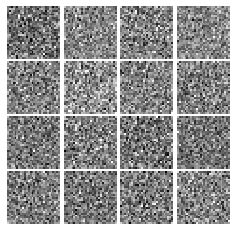

Epoch: 0, Iter: 20, D: 0.5831, G:1.013


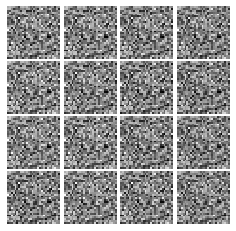

Epoch: 0, Iter: 40, D: 0.5137, G:0.9953


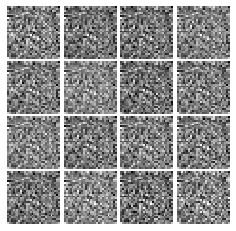

Epoch: 0, Iter: 60, D: 0.2042, G:2.052


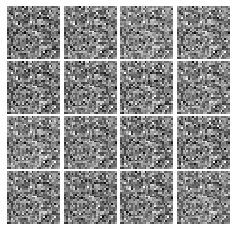

Epoch: 0, Iter: 80, D: 1.259, G:1.661


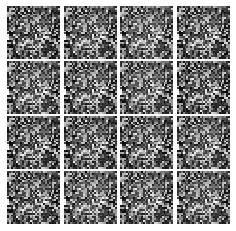

Epoch: 0, Iter: 100, D: 0.9939, G:1.657


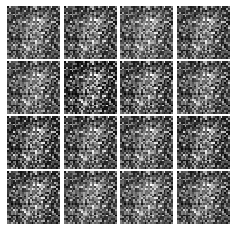

Epoch: 0, Iter: 120, D: 1.218, G:1.13


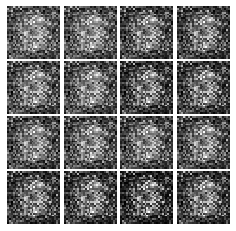

Epoch: 0, Iter: 140, D: 1.37, G:1.346


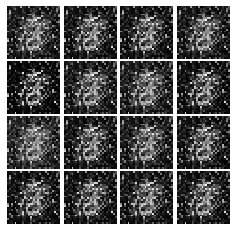

Epoch: 0, Iter: 160, D: 1.252, G:0.9983


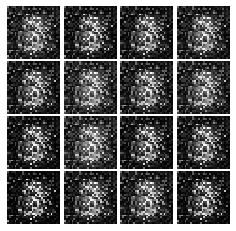

Epoch: 0, Iter: 180, D: 1.63, G:0.8011


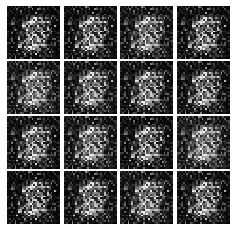

Epoch: 0, Iter: 200, D: 1.498, G:2.283


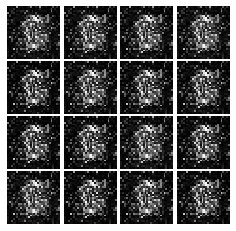

Epoch: 0, Iter: 220, D: 1.09, G:0.982


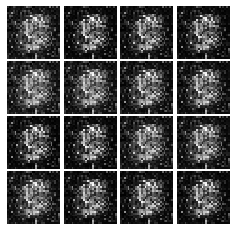

Epoch: 0, Iter: 240, D: 1.039, G:1.629


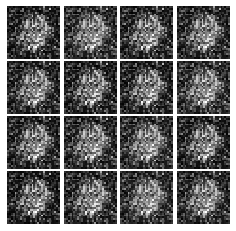

Epoch: 0, Iter: 260, D: 1.041, G:1.234


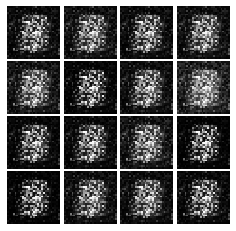

Epoch: 0, Iter: 280, D: 1.279, G:0.8636


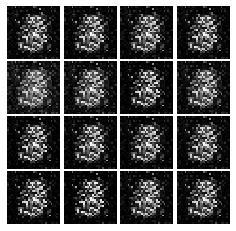

Epoch: 0, Iter: 300, D: 1.062, G:1.046


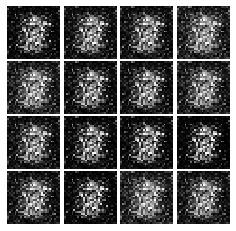

Epoch: 0, Iter: 320, D: 1.167, G:1.439


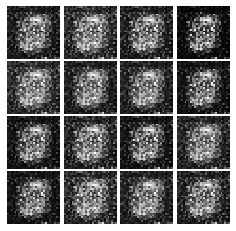

Epoch: 0, Iter: 340, D: 1.033, G:1.753


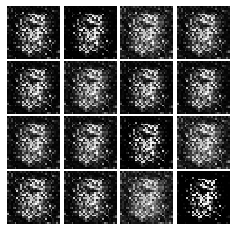

Epoch: 0, Iter: 360, D: 0.9756, G:1.656


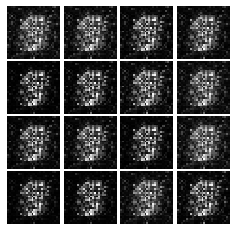

Epoch: 0, Iter: 380, D: 1.837, G:0.2564


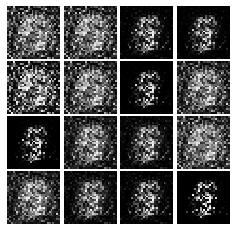

Epoch: 0, Iter: 400, D: 1.04, G:1.612


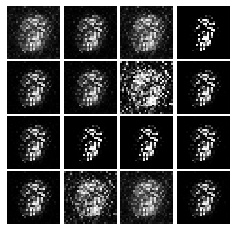

Epoch: 0, Iter: 420, D: 1.198, G:1.453


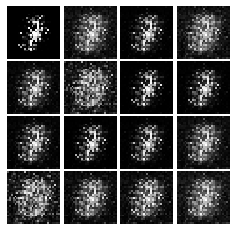

Epoch: 0, Iter: 440, D: 1.322, G:0.9271


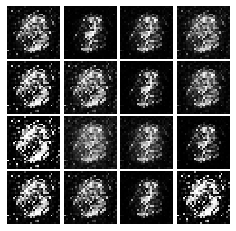

Epoch: 0, Iter: 460, D: 1.234, G:3.039


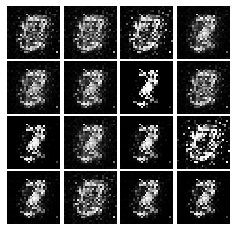

Epoch: 1, Iter: 480, D: 1.14, G:0.9778


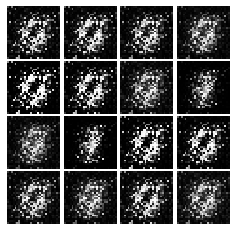

Epoch: 1, Iter: 500, D: 1.726, G:0.9052


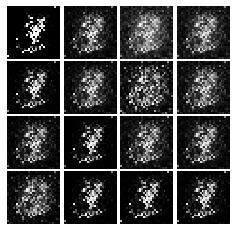

Epoch: 1, Iter: 520, D: 1.056, G:1.636


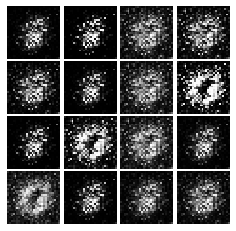

Epoch: 1, Iter: 540, D: 1.57, G:1.212


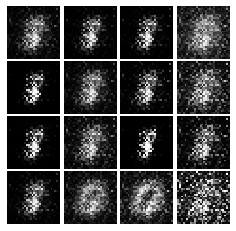

Epoch: 1, Iter: 560, D: 1.218, G:1.088


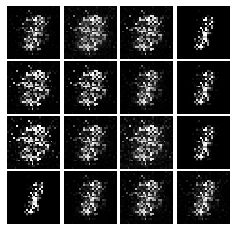

Epoch: 1, Iter: 580, D: 0.8626, G:1.103


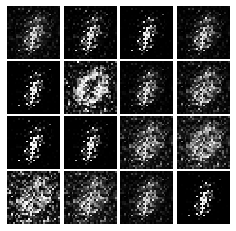

Epoch: 1, Iter: 600, D: 1.089, G:1.245


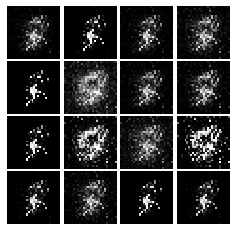

Epoch: 1, Iter: 620, D: 1.053, G:2.069


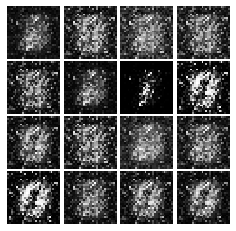

Epoch: 1, Iter: 640, D: 0.8061, G:1.586


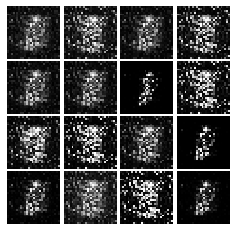

Epoch: 1, Iter: 660, D: 1.127, G:1.109


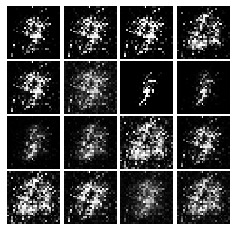

Epoch: 1, Iter: 680, D: 1.491, G:1.07


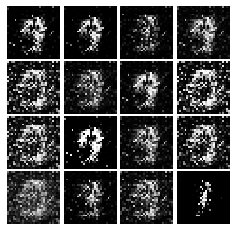

Epoch: 1, Iter: 700, D: 1.305, G:1.154


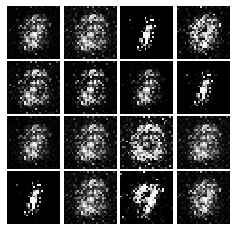

Epoch: 1, Iter: 720, D: 1.264, G:1.119


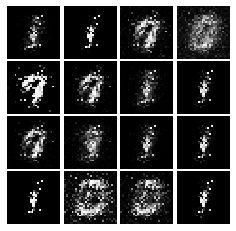

Epoch: 1, Iter: 740, D: 1.083, G:1.701


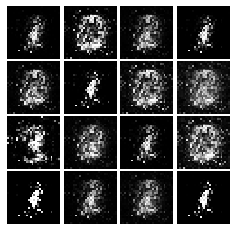

Epoch: 1, Iter: 760, D: 1.134, G:2.236


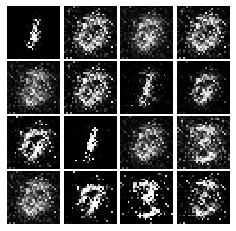

Epoch: 1, Iter: 780, D: 1.368, G:1.434


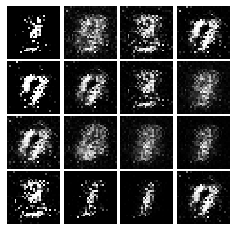

Epoch: 1, Iter: 800, D: 1.325, G:0.952


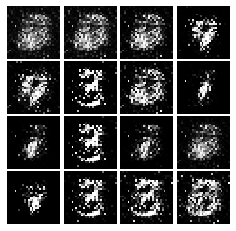

Epoch: 1, Iter: 820, D: 1.362, G:0.8164


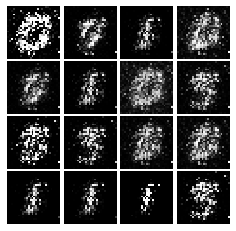

Epoch: 1, Iter: 840, D: 1.279, G:0.9709


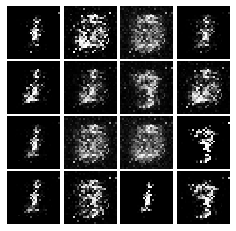

Epoch: 1, Iter: 860, D: 1.059, G:1.651


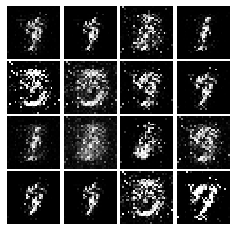

Epoch: 1, Iter: 880, D: 1.134, G:1.201


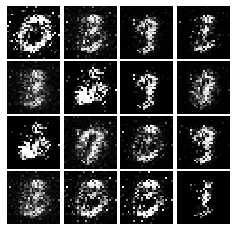

Epoch: 1, Iter: 900, D: 1.276, G:1.071


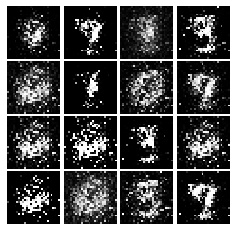

Epoch: 1, Iter: 920, D: 1.376, G:0.8253


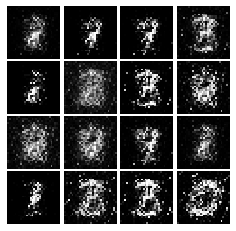

Epoch: 2, Iter: 940, D: 1.213, G:1.081


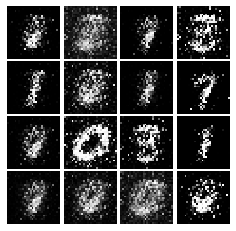

Epoch: 2, Iter: 960, D: 1.164, G:1.254


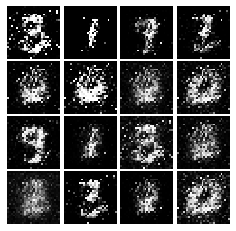

Epoch: 2, Iter: 980, D: 1.207, G:0.9759


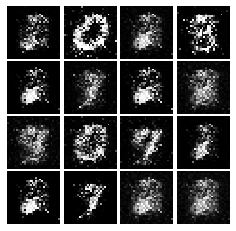

Epoch: 2, Iter: 1000, D: 1.214, G:1.31


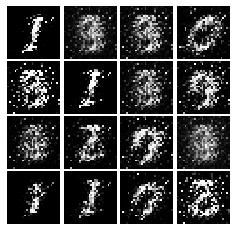

Epoch: 2, Iter: 1020, D: 1.757, G:0.6771


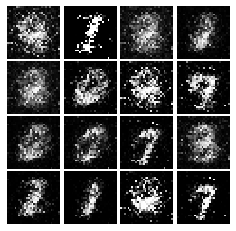

Epoch: 2, Iter: 1040, D: 1.093, G:1.199


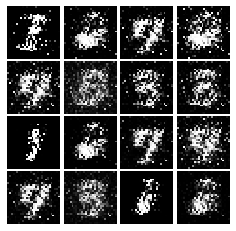

Epoch: 2, Iter: 1060, D: 1.114, G:1.47


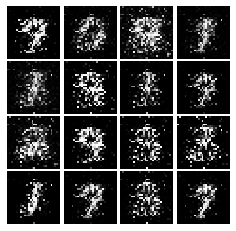

Epoch: 2, Iter: 1080, D: 1.856, G:0.7124


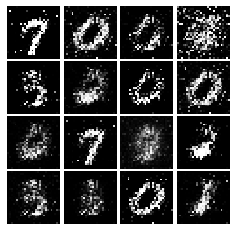

Epoch: 2, Iter: 1100, D: 1.252, G:1.09


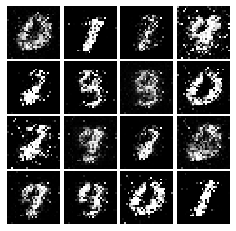

Epoch: 2, Iter: 1120, D: 1.417, G:0.9855


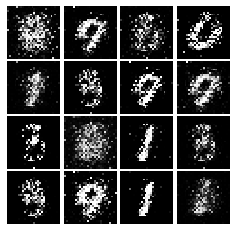

Epoch: 2, Iter: 1140, D: 1.118, G:1.256


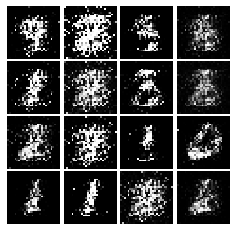

Epoch: 2, Iter: 1160, D: 1.192, G:1.391


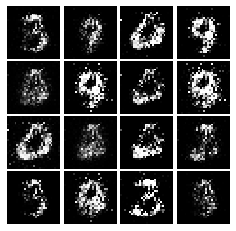

Epoch: 2, Iter: 1180, D: 1.14, G:0.9896


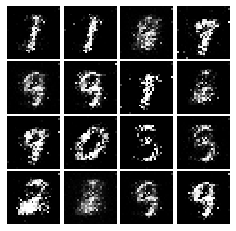

Epoch: 2, Iter: 1200, D: 1.29, G:0.8815


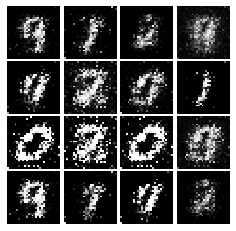

Epoch: 2, Iter: 1220, D: 1.16, G:1.484


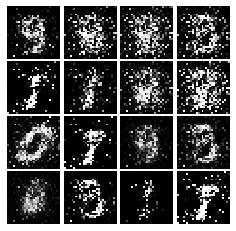

Epoch: 2, Iter: 1240, D: 1.249, G:1.588


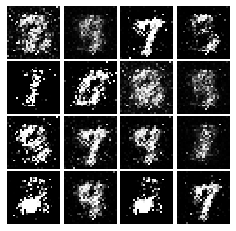

Epoch: 2, Iter: 1260, D: 1.215, G:0.929


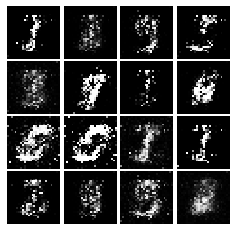

Epoch: 2, Iter: 1280, D: 1.319, G:3.002


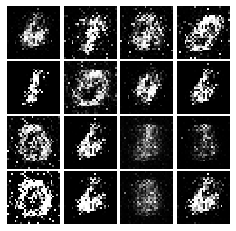

Epoch: 2, Iter: 1300, D: 1.089, G:1.023


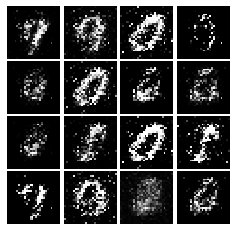

Epoch: 2, Iter: 1320, D: 1.318, G:0.9073


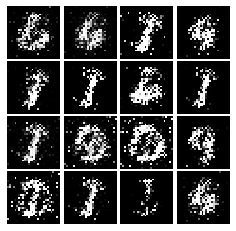

Epoch: 2, Iter: 1340, D: 1.169, G:0.8983


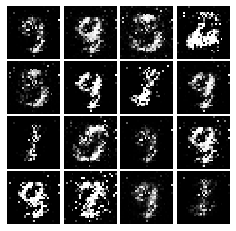

Epoch: 2, Iter: 1360, D: 1.434, G:1.277


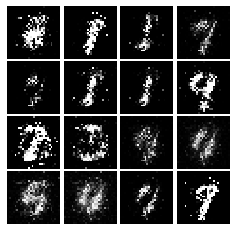

Epoch: 2, Iter: 1380, D: 1.145, G:1.231


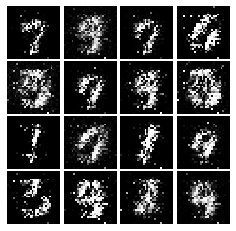

Epoch: 2, Iter: 1400, D: 1.297, G:1.047


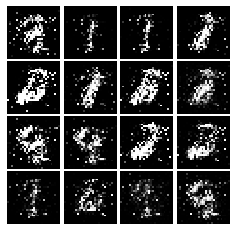

Epoch: 3, Iter: 1420, D: 1.485, G:0.407


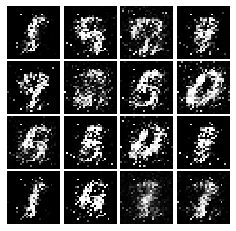

Epoch: 3, Iter: 1440, D: 1.219, G:0.9802


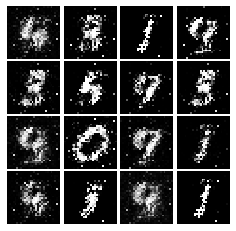

Epoch: 3, Iter: 1460, D: 1.236, G:1.474


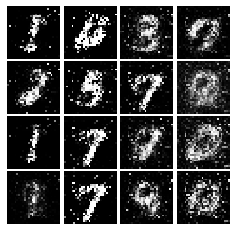

Epoch: 3, Iter: 1480, D: 1.353, G:0.8833


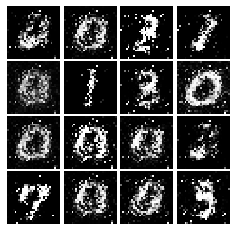

Epoch: 3, Iter: 1500, D: 1.103, G:1.053


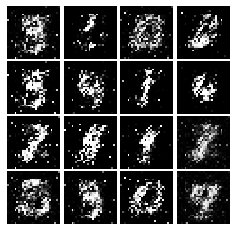

Epoch: 3, Iter: 1520, D: 1.473, G:1.128


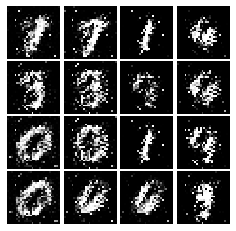

Epoch: 3, Iter: 1540, D: 1.334, G:0.9674


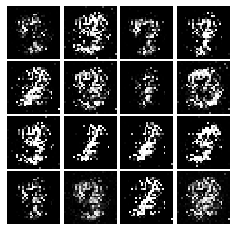

Epoch: 3, Iter: 1560, D: 1.119, G:1.71


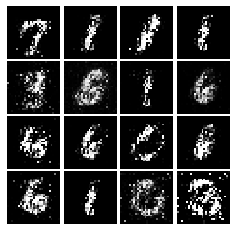

Epoch: 3, Iter: 1580, D: 1.186, G:1.058


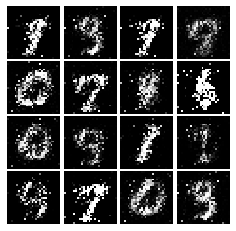

Epoch: 3, Iter: 1600, D: 1.204, G:1.14


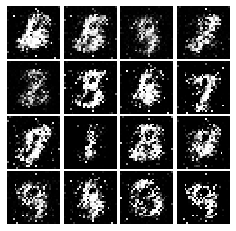

Epoch: 3, Iter: 1620, D: 1.115, G:1.099


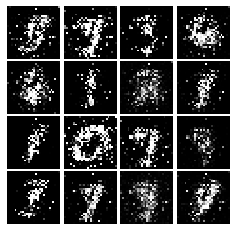

Epoch: 3, Iter: 1640, D: 1.158, G:1.848


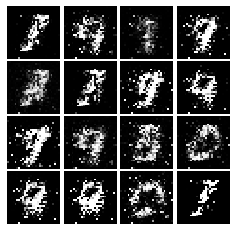

Epoch: 3, Iter: 1660, D: 1.13, G:1.381


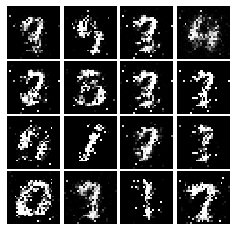

Epoch: 3, Iter: 1680, D: 1.186, G:1.27


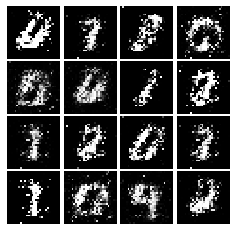

Epoch: 3, Iter: 1700, D: 1.502, G:0.7771


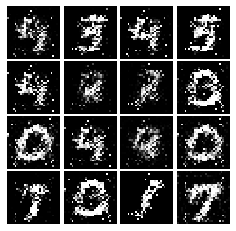

Epoch: 3, Iter: 1720, D: 1.397, G:0.9201


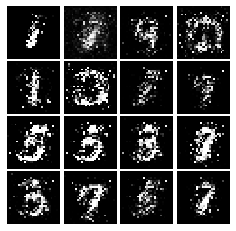

Epoch: 3, Iter: 1740, D: 1.107, G:1.342


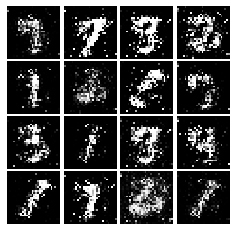

Epoch: 3, Iter: 1760, D: 1.108, G:0.7934


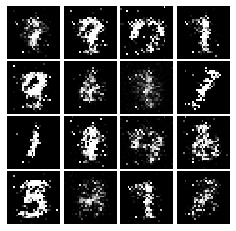

Epoch: 3, Iter: 1780, D: 1.176, G:0.9225


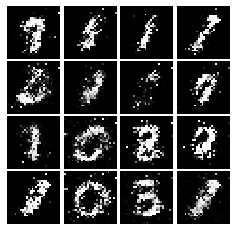

Epoch: 3, Iter: 1800, D: 1.332, G:1.078


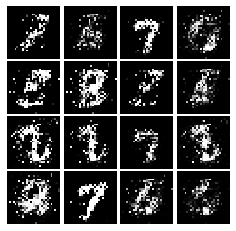

Epoch: 3, Iter: 1820, D: 1.046, G:1.096


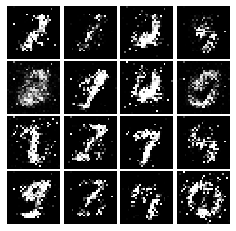

Epoch: 3, Iter: 1840, D: 1.351, G:1.085


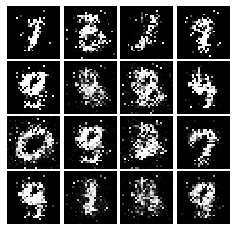

Epoch: 3, Iter: 1860, D: 1.233, G:0.8255


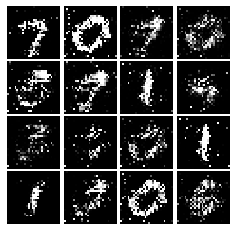

Epoch: 4, Iter: 1880, D: 1.306, G:0.9681


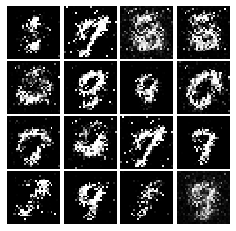

Epoch: 4, Iter: 1900, D: 1.496, G:0.8679


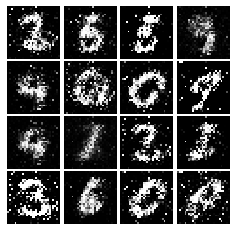

Epoch: 4, Iter: 1920, D: 1.168, G:0.9986


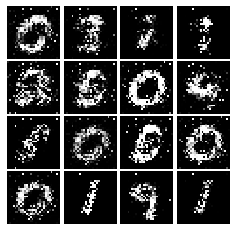

Epoch: 4, Iter: 1940, D: 1.705, G:0.3803


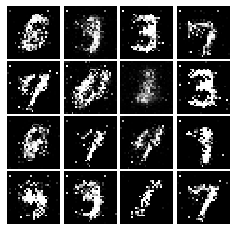

Epoch: 4, Iter: 1960, D: 1.266, G:1.064


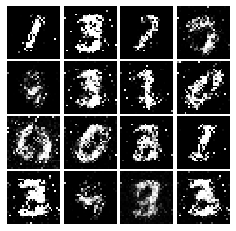

Epoch: 4, Iter: 1980, D: 1.236, G:0.8819


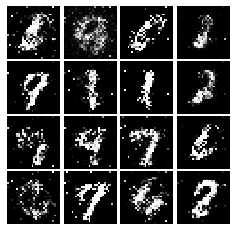

Epoch: 4, Iter: 2000, D: 0.9861, G:0.6626


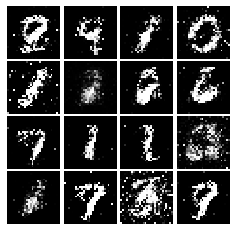

Epoch: 4, Iter: 2020, D: 1.345, G:0.8813


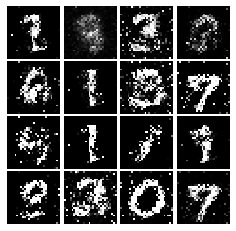

Epoch: 4, Iter: 2040, D: 1.294, G:0.9771


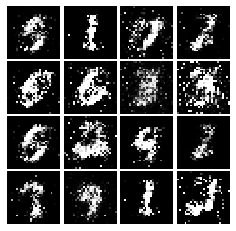

Epoch: 4, Iter: 2060, D: 1.224, G:0.9856


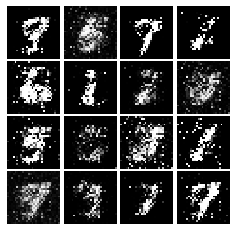

Epoch: 4, Iter: 2080, D: 1.336, G:0.971


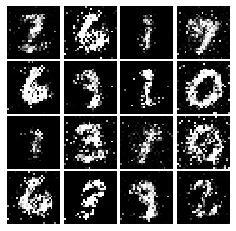

Epoch: 4, Iter: 2100, D: 1.301, G:1.26


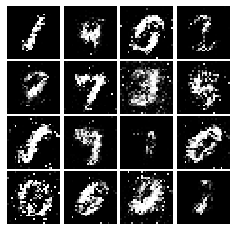

Epoch: 4, Iter: 2120, D: 1.284, G:0.8433


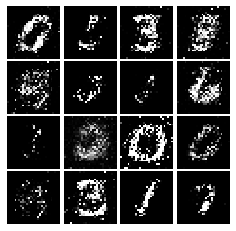

Epoch: 4, Iter: 2140, D: 1.342, G:0.7718


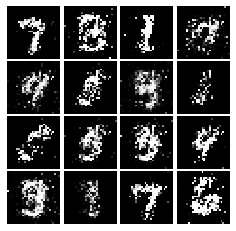

Epoch: 4, Iter: 2160, D: 1.372, G:0.8922


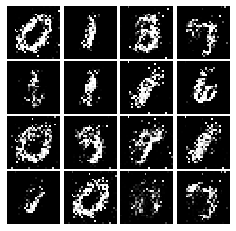

Epoch: 4, Iter: 2180, D: 1.321, G:0.8675


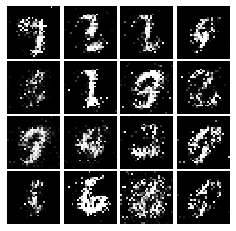

Epoch: 4, Iter: 2200, D: 1.287, G:0.8478


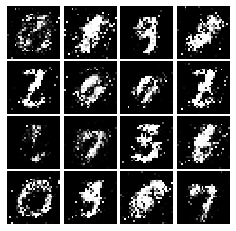

Epoch: 4, Iter: 2220, D: 1.319, G:0.8513


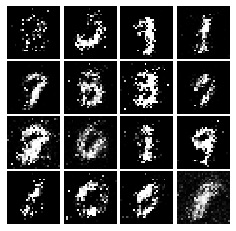

Epoch: 4, Iter: 2240, D: 1.292, G:0.887


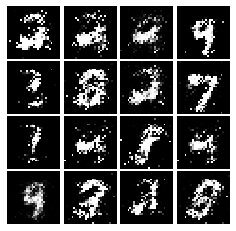

Epoch: 4, Iter: 2260, D: 1.292, G:1.021


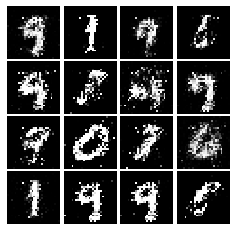

Epoch: 4, Iter: 2280, D: 1.342, G:0.8042


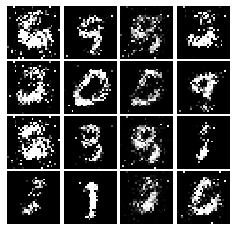

Epoch: 4, Iter: 2300, D: 1.377, G:0.7234


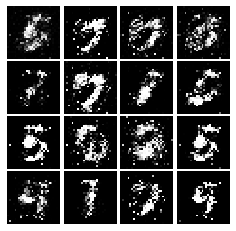

Epoch: 4, Iter: 2320, D: 1.256, G:1.03


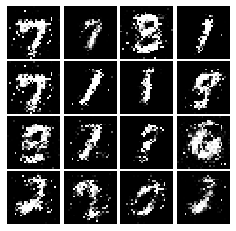

Epoch: 4, Iter: 2340, D: 1.276, G:0.8424


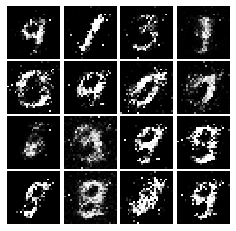

Epoch: 5, Iter: 2360, D: 1.391, G:0.9025


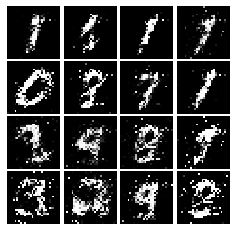

Epoch: 5, Iter: 2380, D: 1.204, G:0.8877


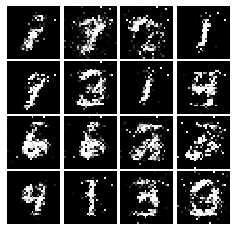

Epoch: 5, Iter: 2400, D: 1.357, G:0.7851


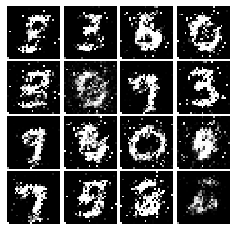

Epoch: 5, Iter: 2420, D: 1.267, G:0.9839


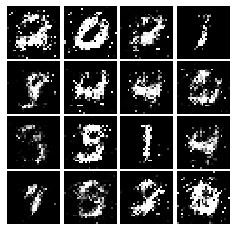

Epoch: 5, Iter: 2440, D: 1.404, G:0.8409


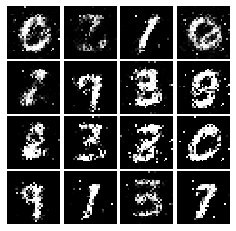

Epoch: 5, Iter: 2460, D: 1.186, G:1.069


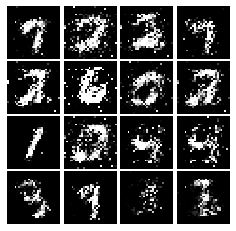

Epoch: 5, Iter: 2480, D: 1.32, G:0.9461


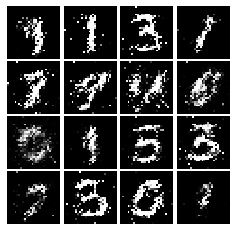

Epoch: 5, Iter: 2500, D: 1.148, G:1.254


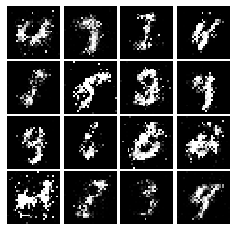

Epoch: 5, Iter: 2520, D: 1.245, G:0.9021


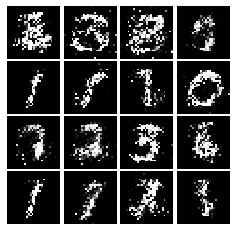

Epoch: 5, Iter: 2540, D: 1.332, G:0.8589


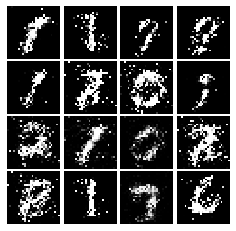

Epoch: 5, Iter: 2560, D: 1.265, G:0.9743


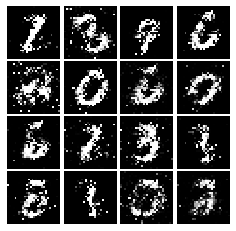

Epoch: 5, Iter: 2580, D: 1.209, G:1.152


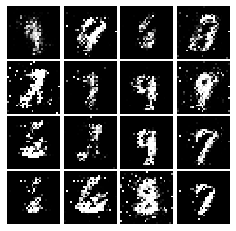

Epoch: 5, Iter: 2600, D: 1.427, G:0.8152


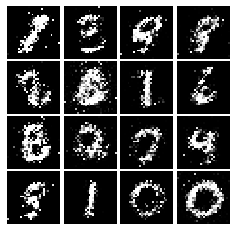

Epoch: 5, Iter: 2620, D: 1.125, G:1.006


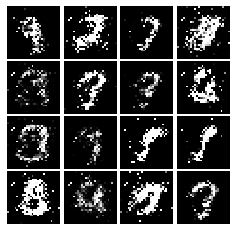

Epoch: 5, Iter: 2640, D: 1.325, G:0.9781


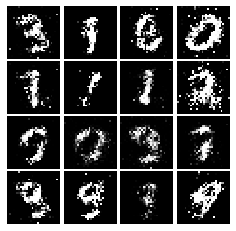

Epoch: 5, Iter: 2660, D: 1.182, G:1.123


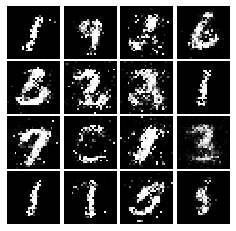

Epoch: 5, Iter: 2680, D: 1.316, G:0.8317


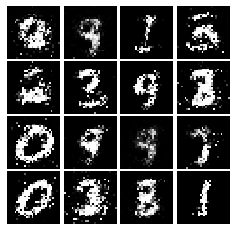

Epoch: 5, Iter: 2700, D: 1.392, G:0.9037


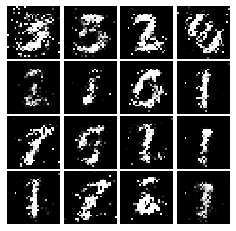

Epoch: 5, Iter: 2720, D: 1.231, G:0.9009


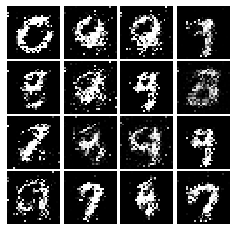

Epoch: 5, Iter: 2740, D: 1.292, G:0.8926


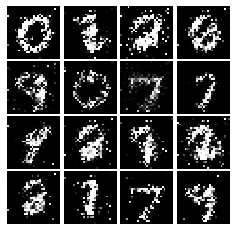

Epoch: 5, Iter: 2760, D: 1.258, G:0.7227


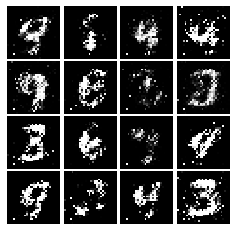

Epoch: 5, Iter: 2780, D: 1.415, G:0.8858


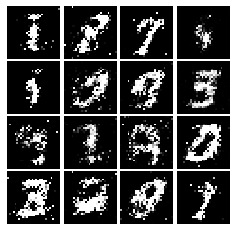

Epoch: 5, Iter: 2800, D: 1.245, G:0.9278


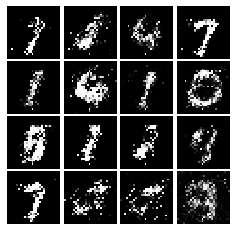

Epoch: 6, Iter: 2820, D: 1.275, G:0.8684


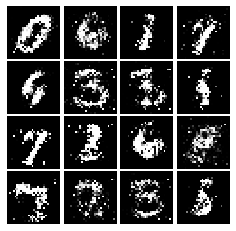

Epoch: 6, Iter: 2840, D: 1.381, G:0.7862


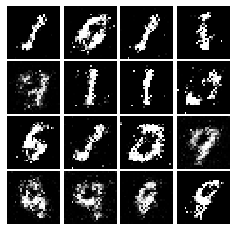

Epoch: 6, Iter: 2860, D: 1.233, G:1.005


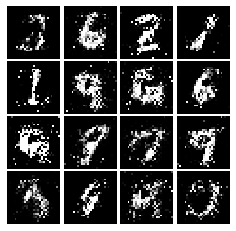

Epoch: 6, Iter: 2880, D: 1.215, G:0.9544


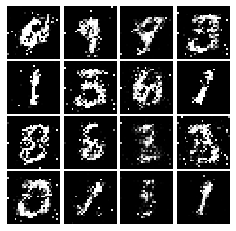

Epoch: 6, Iter: 2900, D: 1.265, G:0.8773


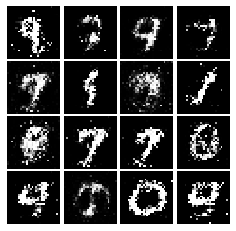

Epoch: 6, Iter: 2920, D: 1.363, G:0.8201


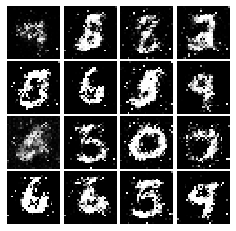

Epoch: 6, Iter: 2940, D: 1.308, G:0.9198


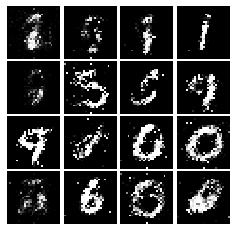

Epoch: 6, Iter: 2960, D: 1.343, G:0.7488


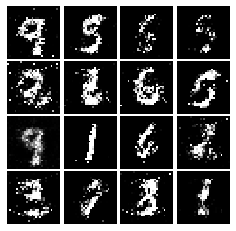

Epoch: 6, Iter: 2980, D: 1.192, G:1.198


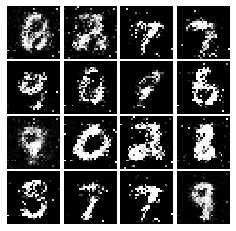

Epoch: 6, Iter: 3000, D: 1.34, G:0.8419


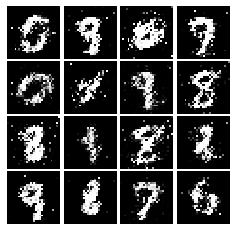

Epoch: 6, Iter: 3020, D: 1.267, G:0.88


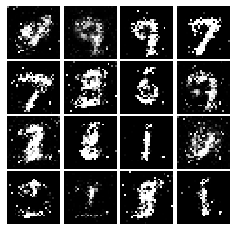

Epoch: 6, Iter: 3040, D: 1.298, G:0.9712


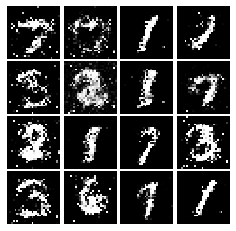

Epoch: 6, Iter: 3060, D: 1.321, G:0.8762


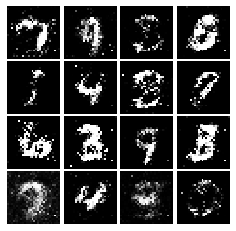

Epoch: 6, Iter: 3080, D: 1.301, G:0.8563


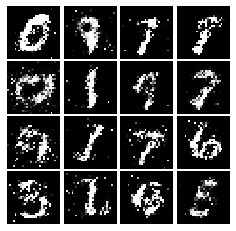

Epoch: 6, Iter: 3100, D: 1.332, G:0.7412


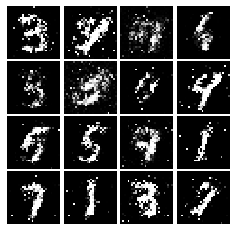

Epoch: 6, Iter: 3120, D: 1.246, G:0.8697


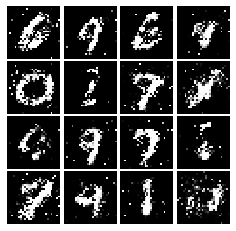

Epoch: 6, Iter: 3140, D: 1.398, G:0.8409


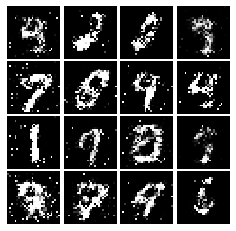

Epoch: 6, Iter: 3160, D: 1.292, G:0.7391


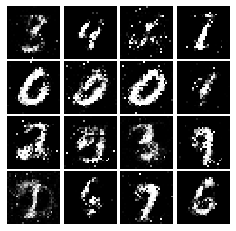

Epoch: 6, Iter: 3180, D: 1.331, G:0.7341


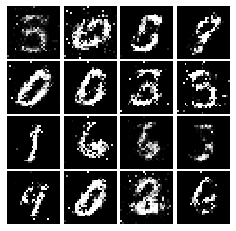

Epoch: 6, Iter: 3200, D: 1.257, G:0.8768


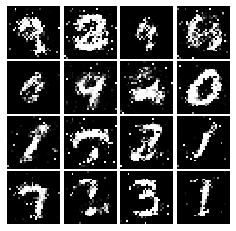

Epoch: 6, Iter: 3220, D: 1.338, G:0.8675


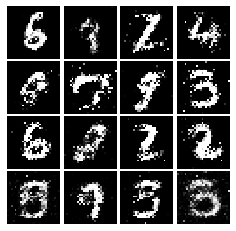

Epoch: 6, Iter: 3240, D: 1.399, G:0.9458


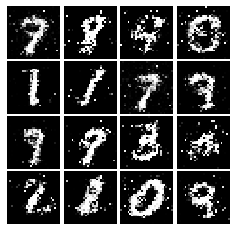

Epoch: 6, Iter: 3260, D: 1.444, G:0.8258


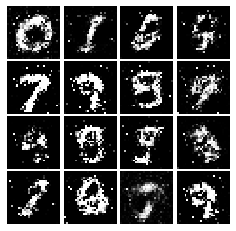

Epoch: 6, Iter: 3280, D: 1.3, G:0.885


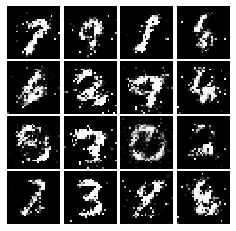

Epoch: 7, Iter: 3300, D: 1.372, G:0.9605


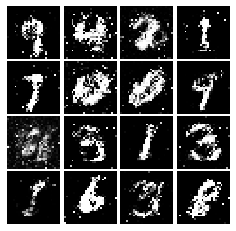

Epoch: 7, Iter: 3320, D: 1.2, G:1.043


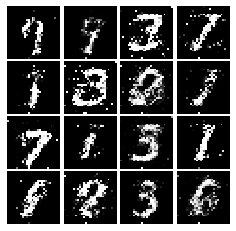

Epoch: 7, Iter: 3340, D: 1.357, G:0.8913


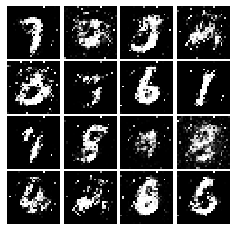

Epoch: 7, Iter: 3360, D: 1.324, G:0.9125


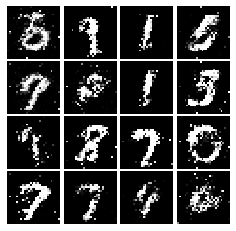

Epoch: 7, Iter: 3380, D: 1.298, G:1.339


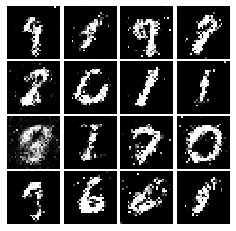

Epoch: 7, Iter: 3400, D: 1.478, G:0.7352


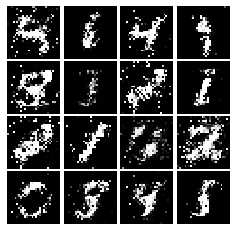

Epoch: 7, Iter: 3420, D: 1.358, G:0.8378


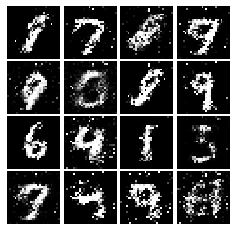

Epoch: 7, Iter: 3440, D: 1.373, G:0.9182


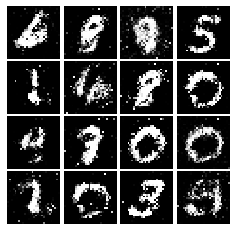

Epoch: 7, Iter: 3460, D: 1.219, G:0.8291


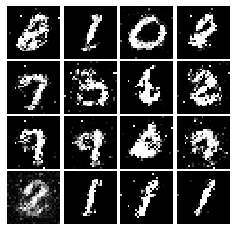

Epoch: 7, Iter: 3480, D: 1.258, G:0.785


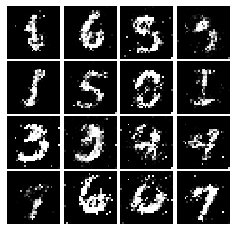

Epoch: 7, Iter: 3500, D: 1.327, G:0.7502


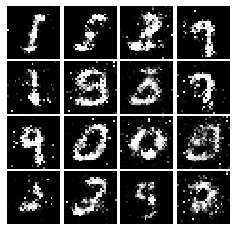

Epoch: 7, Iter: 3520, D: 1.358, G:0.8189


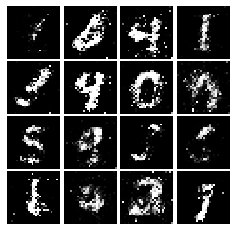

Epoch: 7, Iter: 3540, D: 1.372, G:0.7221


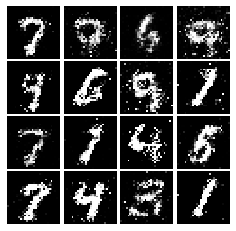

Epoch: 7, Iter: 3560, D: 1.298, G:0.9034


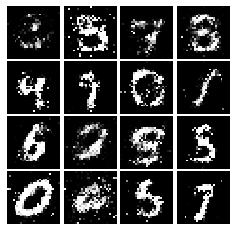

Epoch: 7, Iter: 3580, D: 1.33, G:0.8366


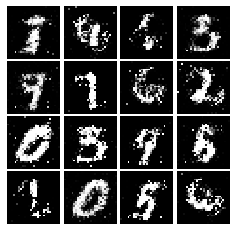

Epoch: 7, Iter: 3600, D: 1.349, G:0.7623


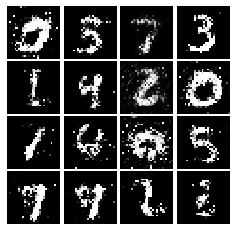

Epoch: 7, Iter: 3620, D: 1.345, G:0.8108


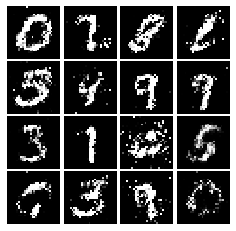

Epoch: 7, Iter: 3640, D: 1.335, G:0.8031


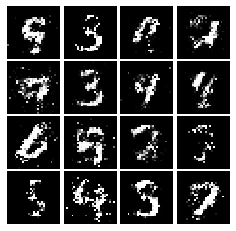

Epoch: 7, Iter: 3660, D: 1.22, G:0.8363


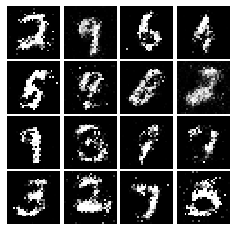

Epoch: 7, Iter: 3680, D: 1.238, G:0.8522


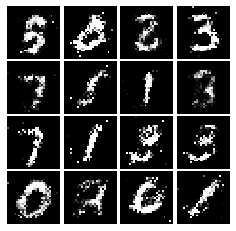

Epoch: 7, Iter: 3700, D: 1.346, G:0.711


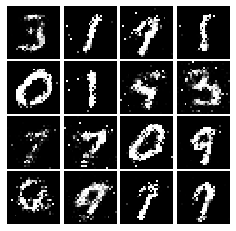

Epoch: 7, Iter: 3720, D: 1.431, G:0.7559


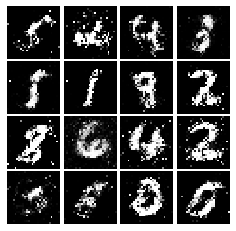

Epoch: 7, Iter: 3740, D: 1.362, G:0.8118


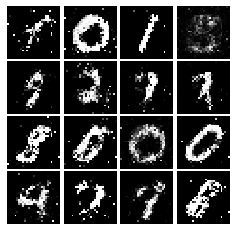

Epoch: 8, Iter: 3760, D: 1.379, G:0.8939


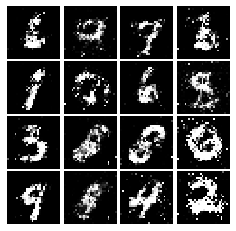

Epoch: 8, Iter: 3780, D: 1.292, G:0.8178


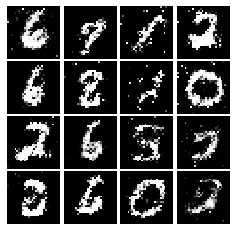

Epoch: 8, Iter: 3800, D: 1.308, G:0.8169


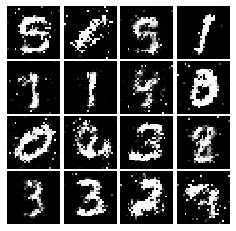

Epoch: 8, Iter: 3820, D: 1.338, G:0.8525


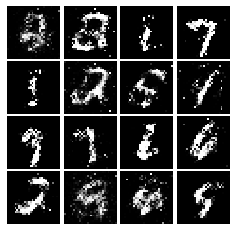

Epoch: 8, Iter: 3840, D: 1.369, G:0.8177


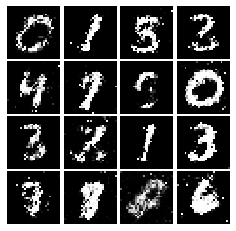

Epoch: 8, Iter: 3860, D: 1.304, G:0.8148


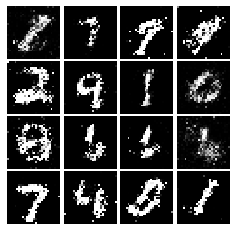

Epoch: 8, Iter: 3880, D: 1.275, G:0.7882


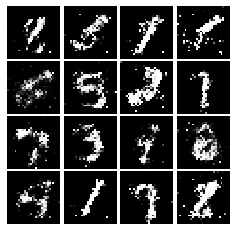

Epoch: 8, Iter: 3900, D: 1.305, G:0.8095


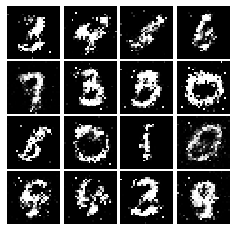

Epoch: 8, Iter: 3920, D: 1.296, G:0.7661


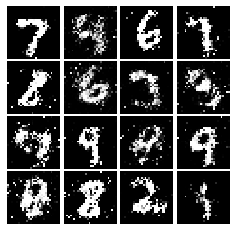

Epoch: 8, Iter: 3940, D: 1.311, G:0.7971


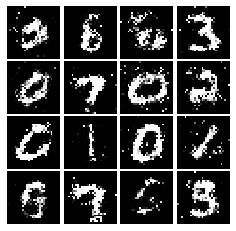

Epoch: 8, Iter: 3960, D: 1.403, G:0.8146


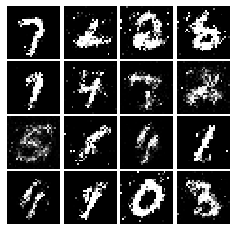

Epoch: 8, Iter: 3980, D: 1.286, G:0.6913


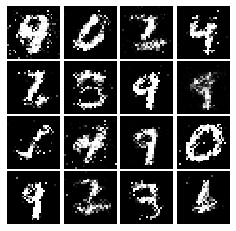

Epoch: 8, Iter: 4000, D: 1.301, G:0.7451


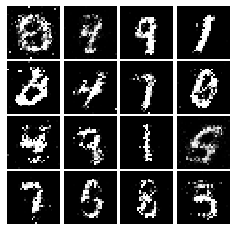

Epoch: 8, Iter: 4020, D: 1.327, G:0.7588


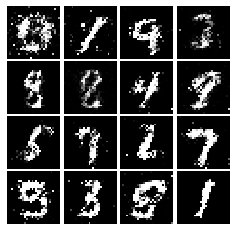

Epoch: 8, Iter: 4040, D: 1.293, G:0.7655


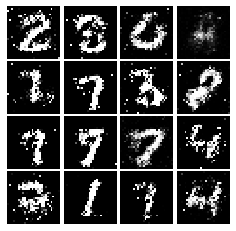

Epoch: 8, Iter: 4060, D: 1.239, G:0.6991


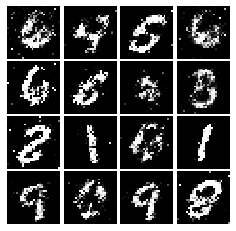

Epoch: 8, Iter: 4080, D: 1.383, G:0.7298


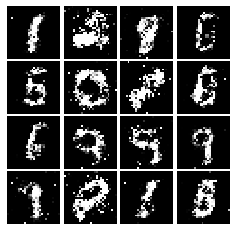

Epoch: 8, Iter: 4100, D: 1.346, G:0.7604


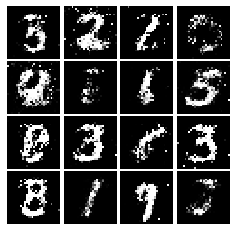

Epoch: 8, Iter: 4120, D: 1.383, G:0.8013


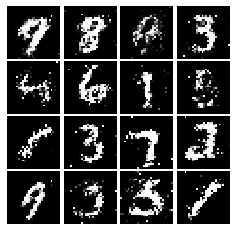

Epoch: 8, Iter: 4140, D: 1.33, G:0.8592


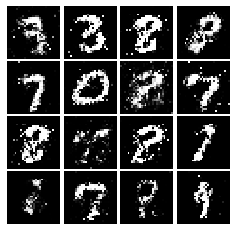

Epoch: 8, Iter: 4160, D: 1.342, G:0.8623


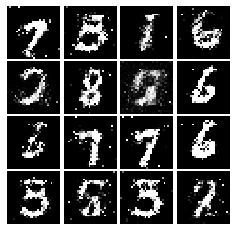

Epoch: 8, Iter: 4180, D: 1.374, G:0.8366


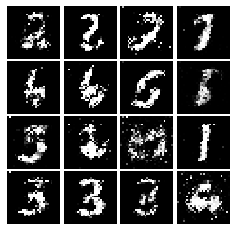

Epoch: 8, Iter: 4200, D: 1.303, G:0.839


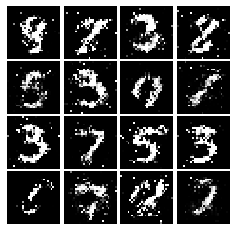

Epoch: 8, Iter: 4220, D: 1.412, G:0.7449


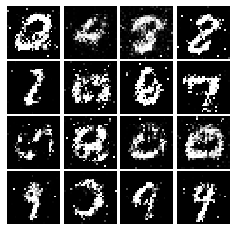

Epoch: 9, Iter: 4240, D: 1.353, G:0.7898


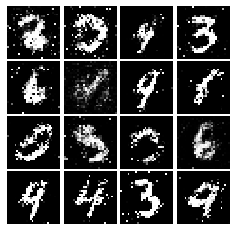

Epoch: 9, Iter: 4260, D: 1.328, G:0.8013


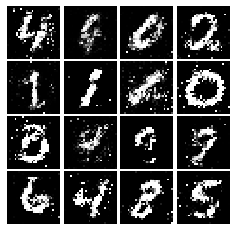

Epoch: 9, Iter: 4280, D: 1.371, G:0.8377


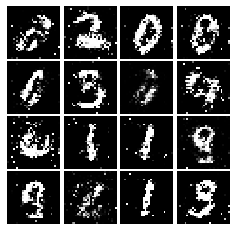

Epoch: 9, Iter: 4300, D: 1.352, G:0.7936


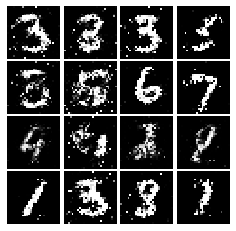

Epoch: 9, Iter: 4320, D: 1.329, G:0.8173


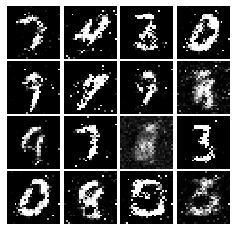

Epoch: 9, Iter: 4340, D: 1.311, G:0.9079


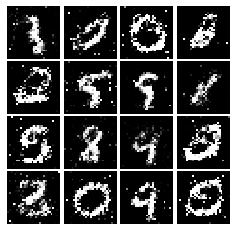

Epoch: 9, Iter: 4360, D: 1.372, G:0.8666


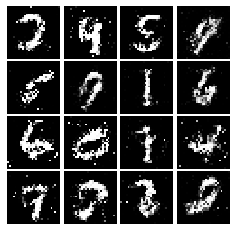

Epoch: 9, Iter: 4380, D: 1.412, G:0.8107


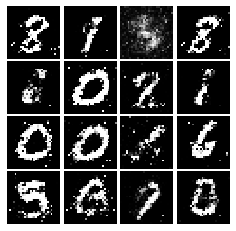

Epoch: 9, Iter: 4400, D: 1.159, G:0.8501


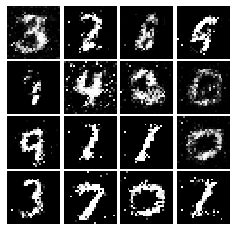

Epoch: 9, Iter: 4420, D: 1.314, G:0.832


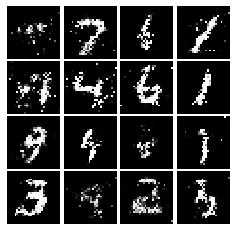

Epoch: 9, Iter: 4440, D: 1.293, G:0.7955


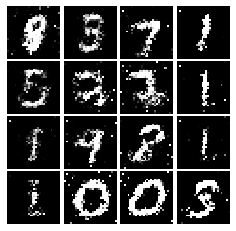

Epoch: 9, Iter: 4460, D: 1.359, G:0.768


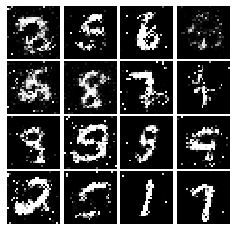

Epoch: 9, Iter: 4480, D: 1.268, G:0.9216


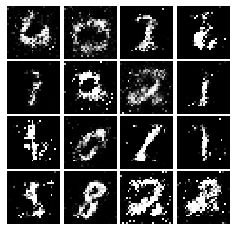

Epoch: 9, Iter: 4500, D: 1.384, G:0.8956


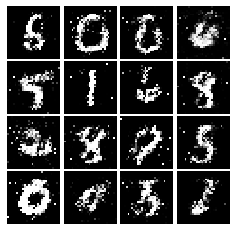

Epoch: 9, Iter: 4520, D: 1.408, G:0.8788


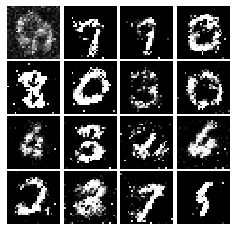

Epoch: 9, Iter: 4540, D: 1.279, G:0.7511


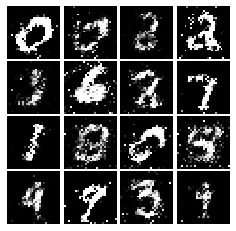

Epoch: 9, Iter: 4560, D: 1.305, G:0.826


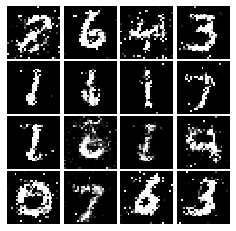

Epoch: 9, Iter: 4580, D: 1.306, G:0.8667


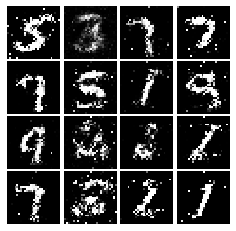

Epoch: 9, Iter: 4600, D: 1.37, G:0.9325


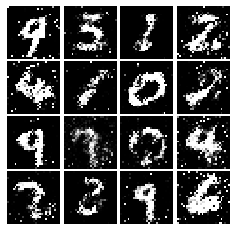

Epoch: 9, Iter: 4620, D: 1.299, G:0.8376


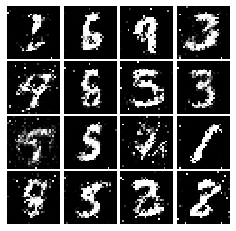

Epoch: 9, Iter: 4640, D: 1.294, G:0.7626


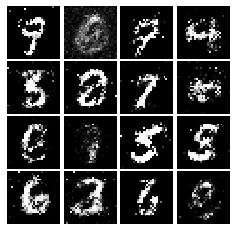

Epoch: 9, Iter: 4660, D: 1.381, G:0.8939


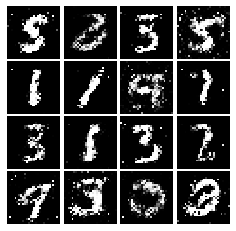

Epoch: 9, Iter: 4680, D: 1.246, G:0.8379


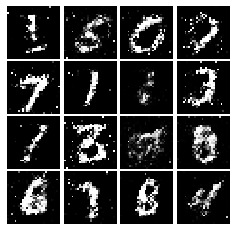

Final images


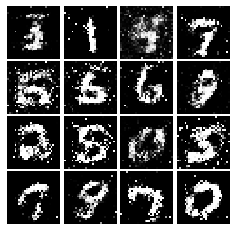

In [17]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss)

# Least Squares GAN
We'll now look at [Least Squares GAN](https://arxiv.org/abs/1611.04076), a newer, more stable alternative to the original GAN loss function. For this part, all we have to do is change the loss function and retrain the model. We'll implement equation (9) in the paper, with the generator loss:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$


**HINTS**: Instead of computing the expectation, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing. When plugging in for $D(x)$ and $D(G(z))$ use the direct output from the discriminator (`score_real` and `score_fake`).

In [18]:
def ls_discriminator_loss(scores_real, scores_fake):
    """
    Compute the Least-Squares GAN loss for the discriminator.
    
    Inputs:
    - scores_real: Tensor of shape (N, 1) giving scores for the real data.
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    loss = 0.5*tf.reduce_mean(tf.square(scores_real - 1)) + 0.5*tf.reduce_mean(tf.square(scores_fake))
    pass

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def ls_generator_loss(scores_fake):
    """
    Computes the Least-Squares GAN loss for the generator.
    
    Inputs:
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    loss = 0.5*tf.reduce_mean((tf.square(scores_fake-1)))
    pass

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your LSGAN loss. You should see errors less than 1e-8.

In [19]:
def test_lsgan_loss(score_real, score_fake, d_loss_true, g_loss_true):
    
    d_loss = ls_discriminator_loss(tf.constant(score_real), tf.constant(score_fake))
    g_loss = ls_generator_loss(tf.constant(score_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_lsgan_loss(answers['logits_real'], answers['logits_fake'],
                answers['d_loss_lsgan_true'], answers['g_loss_lsgan_true'])

Maximum error in d_loss: 0
Maximum error in g_loss: 0


Create new training steps so we instead minimize the LSGAN loss:

Epoch: 0, Iter: 0, D: 0.1295, G:0.3471


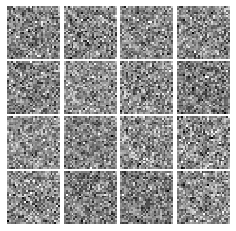

Epoch: 0, Iter: 20, D: 0.09769, G:1.306


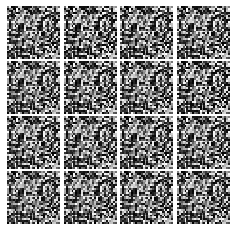

Epoch: 0, Iter: 40, D: 0.1849, G:1.222


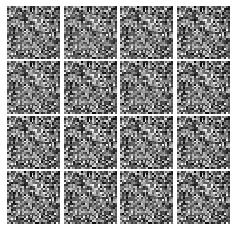

Epoch: 0, Iter: 60, D: 0.03243, G:0.5756


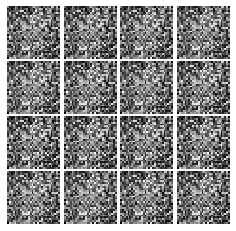

Epoch: 0, Iter: 80, D: 0.09053, G:1.019


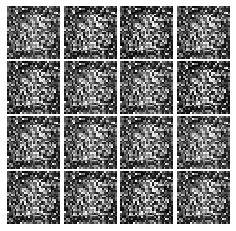

Epoch: 0, Iter: 100, D: 0.09275, G:1.059


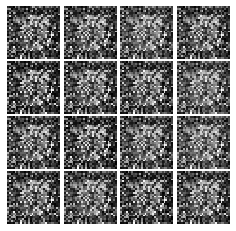

Epoch: 0, Iter: 120, D: 0.08996, G:0.3393


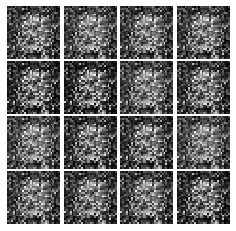

Epoch: 0, Iter: 140, D: 0.06657, G:0.3943


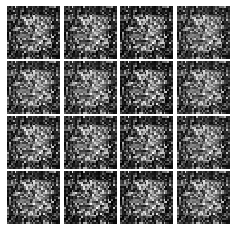

Epoch: 0, Iter: 160, D: 0.8533, G:0.2194


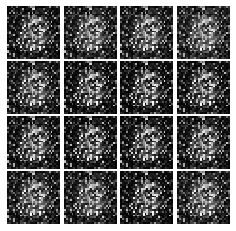

Epoch: 0, Iter: 180, D: 0.1573, G:0.3968


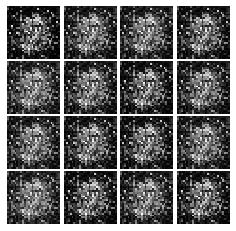

Epoch: 0, Iter: 200, D: 0.1825, G:0.8964


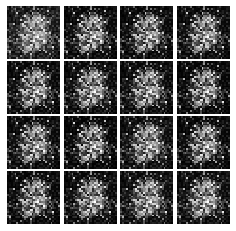

Epoch: 0, Iter: 220, D: 0.1378, G:0.629


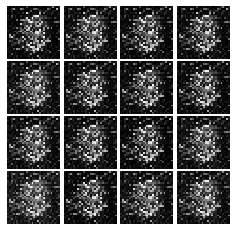

Epoch: 0, Iter: 240, D: 0.241, G:0.1876


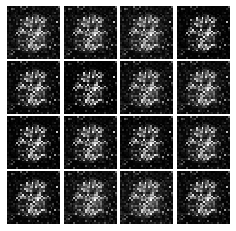

Epoch: 0, Iter: 260, D: 0.3261, G:0.8033


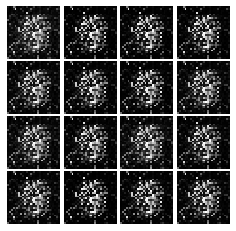

Epoch: 0, Iter: 280, D: 0.1659, G:0.4326


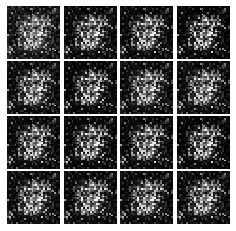

Epoch: 0, Iter: 300, D: 0.1658, G:0.3175


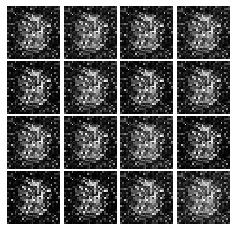

Epoch: 0, Iter: 320, D: 0.1202, G:0.7146


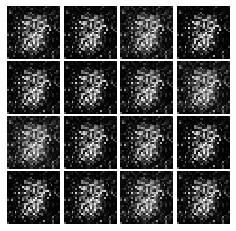

Epoch: 0, Iter: 340, D: 0.2091, G:0.5658


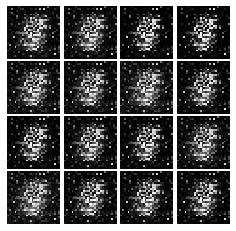

Epoch: 0, Iter: 360, D: 0.1684, G:0.3088


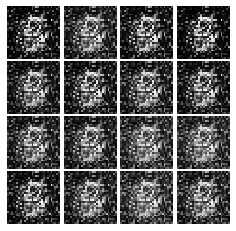

Epoch: 0, Iter: 380, D: 0.1041, G:0.5401


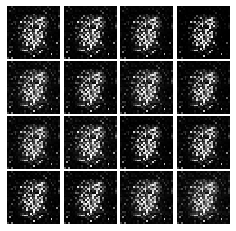

Epoch: 0, Iter: 400, D: 0.1352, G:0.3798


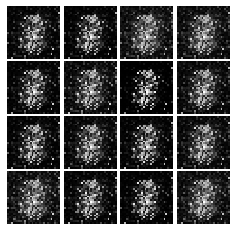

Epoch: 0, Iter: 420, D: 0.2075, G:0.2398


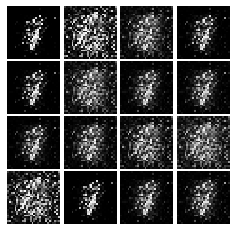

Epoch: 0, Iter: 440, D: 0.2284, G:0.94


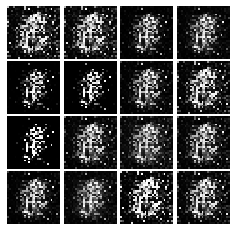

Epoch: 0, Iter: 460, D: 0.05253, G:0.5587


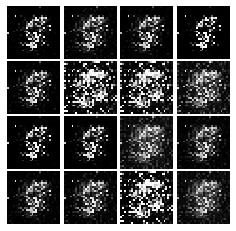

Epoch: 1, Iter: 480, D: 0.1714, G:0.3275


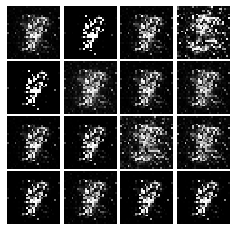

Epoch: 1, Iter: 500, D: 0.4159, G:0.7664


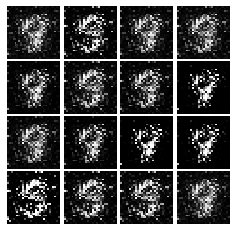

Epoch: 1, Iter: 520, D: 0.1033, G:0.3907


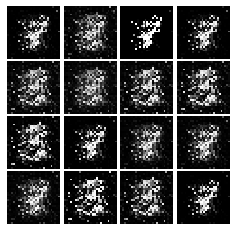

Epoch: 1, Iter: 540, D: 0.1332, G:0.4428


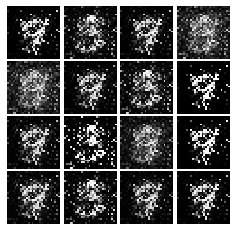

Epoch: 1, Iter: 560, D: 0.1223, G:0.4893


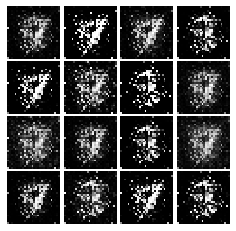

Epoch: 1, Iter: 580, D: 0.1475, G:0.5626


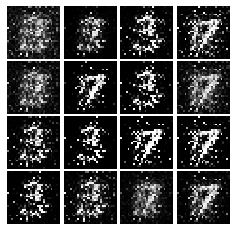

Epoch: 1, Iter: 600, D: 0.1146, G:0.3687


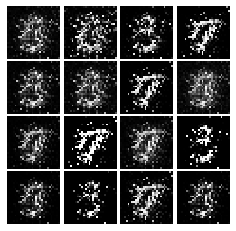

Epoch: 1, Iter: 620, D: 0.0846, G:0.3893


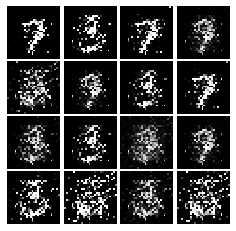

Epoch: 1, Iter: 640, D: 0.3818, G:0.1489


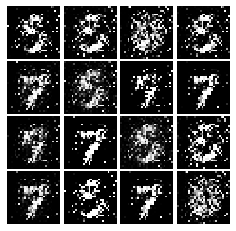

Epoch: 1, Iter: 660, D: 0.1203, G:0.4193


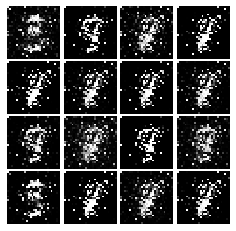

Epoch: 1, Iter: 680, D: 0.09396, G:0.4371


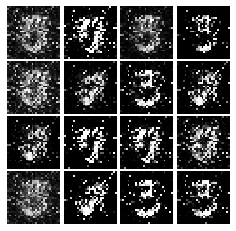

Epoch: 1, Iter: 700, D: 0.1418, G:0.2555


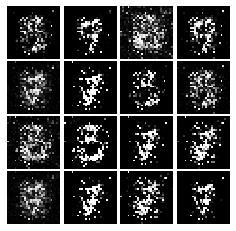

Epoch: 1, Iter: 720, D: 0.1718, G:0.2328


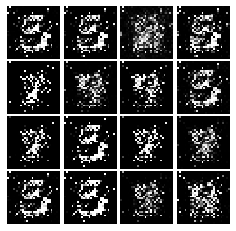

Epoch: 1, Iter: 740, D: 0.1011, G:0.3956


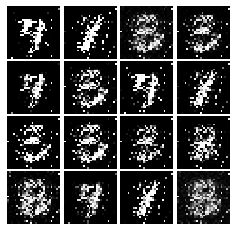

Epoch: 1, Iter: 760, D: 0.1345, G:0.6653


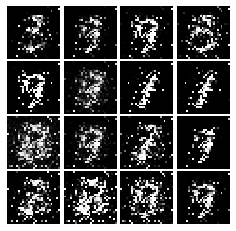

Epoch: 1, Iter: 780, D: 0.1429, G:0.2593


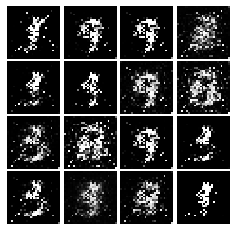

Epoch: 1, Iter: 800, D: 0.1619, G:0.322


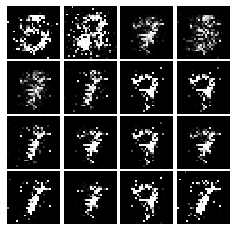

Epoch: 1, Iter: 820, D: 0.1332, G:0.346


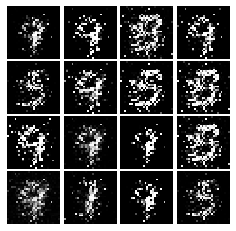

Epoch: 1, Iter: 840, D: 0.1019, G:0.5697


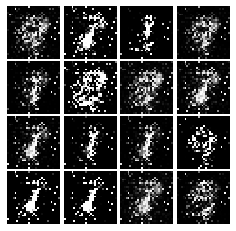

Epoch: 1, Iter: 860, D: 0.07629, G:0.439


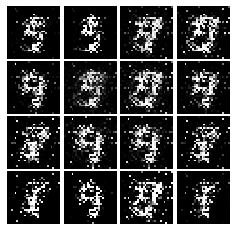

Epoch: 1, Iter: 880, D: 0.155, G:0.2829


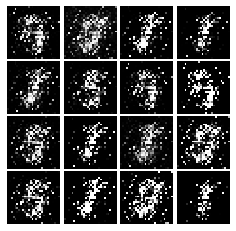

Epoch: 1, Iter: 900, D: 0.1093, G:0.4644


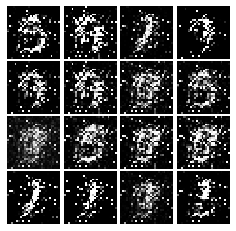

Epoch: 1, Iter: 920, D: 0.1398, G:0.1791


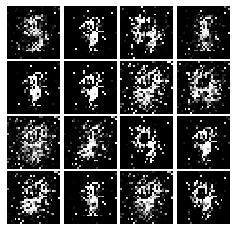

Epoch: 2, Iter: 940, D: 0.1232, G:0.4718


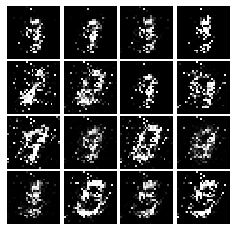

Epoch: 2, Iter: 960, D: 0.1323, G:0.3793


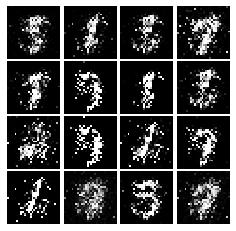

Epoch: 2, Iter: 980, D: 0.1373, G:0.6941


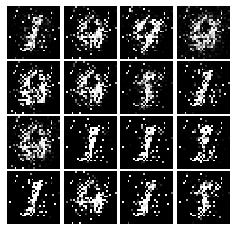

Epoch: 2, Iter: 1000, D: 0.1205, G:0.3956


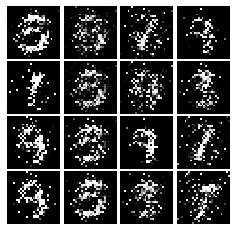

Epoch: 2, Iter: 1020, D: 0.1209, G:0.2411


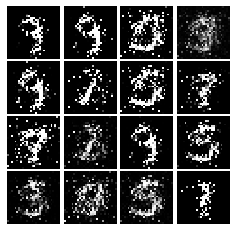

Epoch: 2, Iter: 1040, D: 0.1236, G:0.383


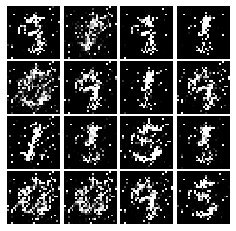

Epoch: 2, Iter: 1060, D: 0.4312, G:0.1517


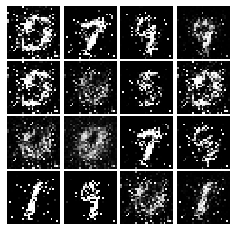

Epoch: 2, Iter: 1080, D: 0.123, G:0.369


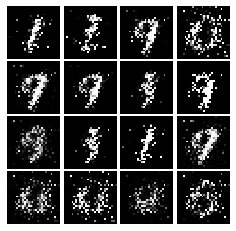

Epoch: 2, Iter: 1100, D: 0.1775, G:0.3073


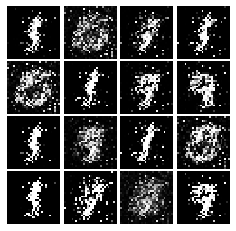

Epoch: 2, Iter: 1120, D: 0.1608, G:0.2954


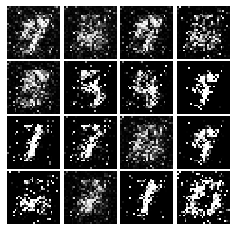

Epoch: 2, Iter: 1140, D: 0.1543, G:0.3013


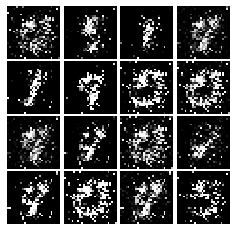

Epoch: 2, Iter: 1160, D: 0.1432, G:0.3146


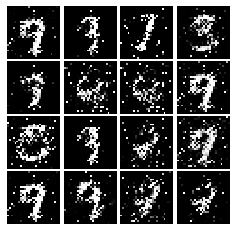

Epoch: 2, Iter: 1180, D: 0.154, G:0.2319


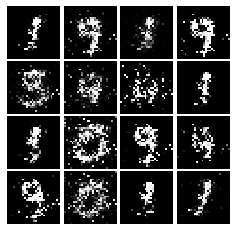

Epoch: 2, Iter: 1200, D: 0.1658, G:0.3482


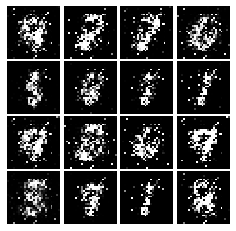

Epoch: 2, Iter: 1220, D: 0.2444, G:0.2594


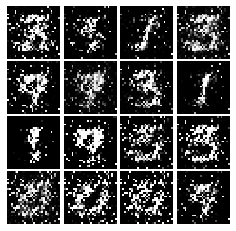

Epoch: 2, Iter: 1240, D: 0.1545, G:0.1779


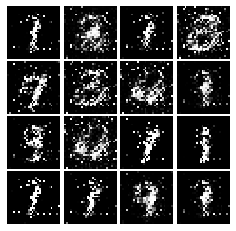

Epoch: 2, Iter: 1260, D: 0.154, G:0.3


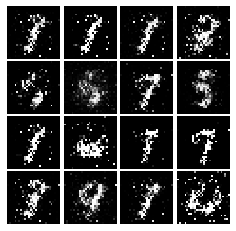

Epoch: 2, Iter: 1280, D: 0.2019, G:0.03042


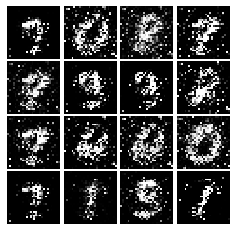

Epoch: 2, Iter: 1300, D: 0.1337, G:0.5532


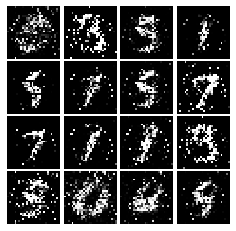

Epoch: 2, Iter: 1320, D: 0.2364, G:0.2256


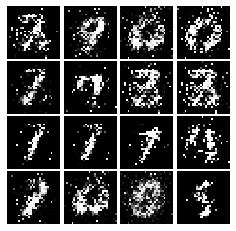

Epoch: 2, Iter: 1340, D: 0.1574, G:0.2538


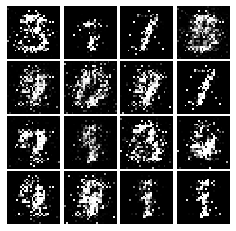

Epoch: 2, Iter: 1360, D: 0.1766, G:0.2134


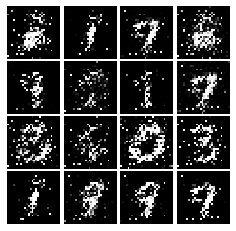

Epoch: 2, Iter: 1380, D: 0.1317, G:0.3764


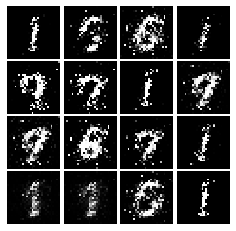

Epoch: 2, Iter: 1400, D: 0.1488, G:0.2219


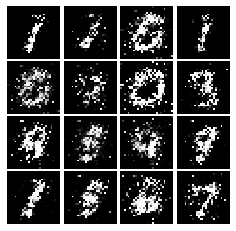

Epoch: 3, Iter: 1420, D: 0.181, G:0.283


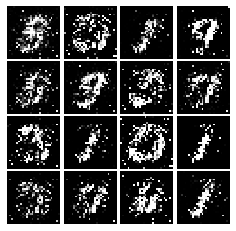

Epoch: 3, Iter: 1440, D: 0.2128, G:0.3691


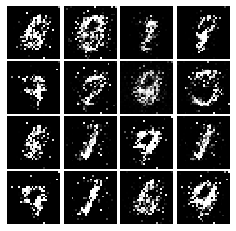

Epoch: 3, Iter: 1460, D: 0.199, G:0.5165


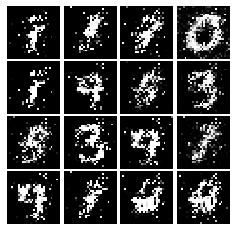

Epoch: 3, Iter: 1480, D: 0.2093, G:0.2116


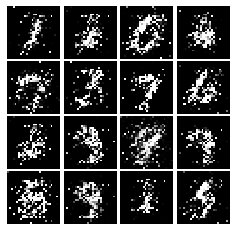

Epoch: 3, Iter: 1500, D: 0.1604, G:0.3289


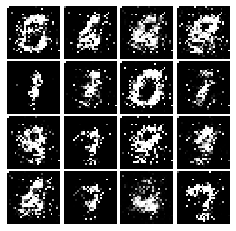

Epoch: 3, Iter: 1520, D: 0.2092, G:0.2724


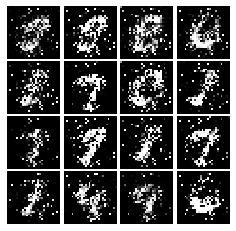

Epoch: 3, Iter: 1540, D: 0.3554, G:0.1816


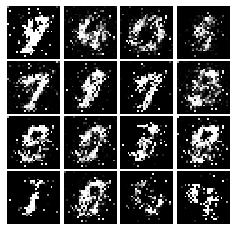

Epoch: 3, Iter: 1560, D: 0.1646, G:0.2229


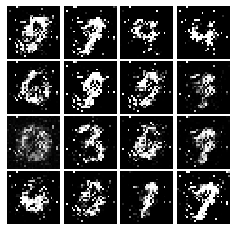

Epoch: 3, Iter: 1580, D: 0.1985, G:0.2216


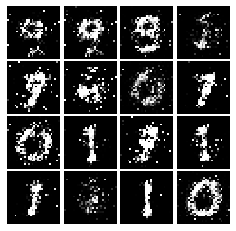

Epoch: 3, Iter: 1600, D: 0.1578, G:0.2654


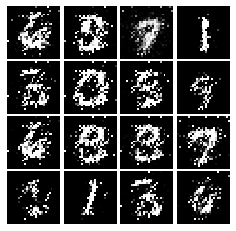

Epoch: 3, Iter: 1620, D: 0.1567, G:0.2558


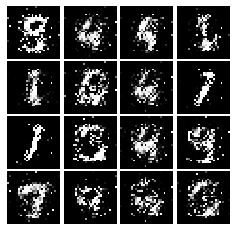

Epoch: 3, Iter: 1640, D: 0.1808, G:0.2461


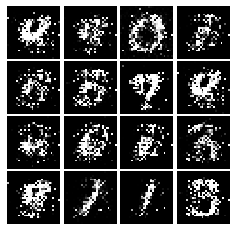

Epoch: 3, Iter: 1660, D: 0.161, G:0.3075


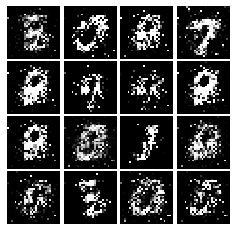

Epoch: 3, Iter: 1680, D: 0.1394, G:0.2761


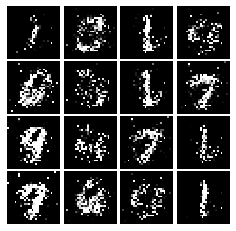

Epoch: 3, Iter: 1700, D: 0.1788, G:0.2177


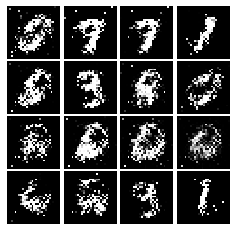

Epoch: 3, Iter: 1720, D: 0.157, G:0.2653


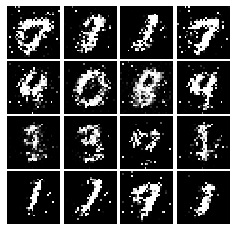

Epoch: 3, Iter: 1740, D: 0.1755, G:0.2437


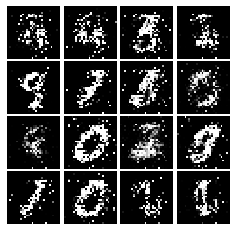

Epoch: 3, Iter: 1760, D: 0.164, G:0.2206


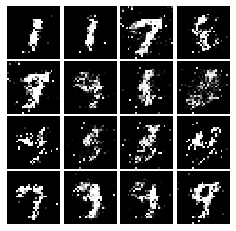

Epoch: 3, Iter: 1780, D: 0.1755, G:0.2361


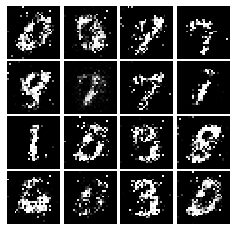

Epoch: 3, Iter: 1800, D: 0.2196, G:0.24


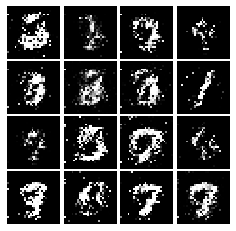

Epoch: 3, Iter: 1820, D: 0.199, G:0.1941


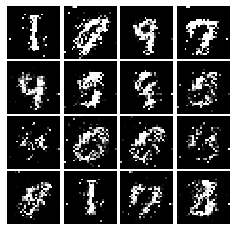

Epoch: 3, Iter: 1840, D: 0.1988, G:0.2757


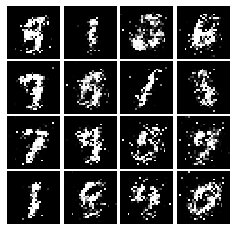

Epoch: 3, Iter: 1860, D: 0.1826, G:0.1683


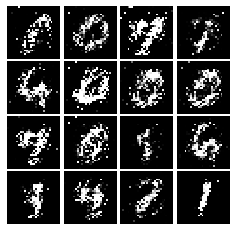

Epoch: 4, Iter: 1880, D: 0.1973, G:0.2276


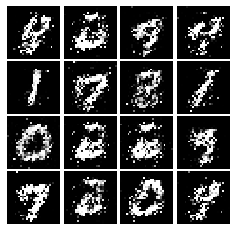

Epoch: 4, Iter: 1900, D: 0.2014, G:0.2289


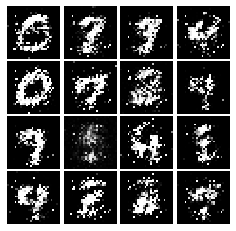

Epoch: 4, Iter: 1920, D: 0.1706, G:0.2469


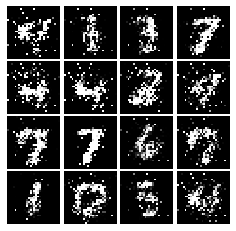

Epoch: 4, Iter: 1940, D: 0.2122, G:0.1992


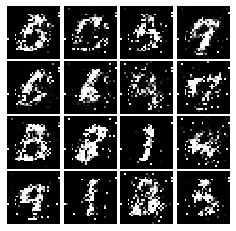

Epoch: 4, Iter: 1960, D: 0.2019, G:0.2599


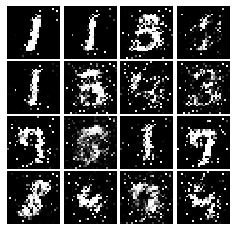

Epoch: 4, Iter: 1980, D: 0.2092, G:0.207


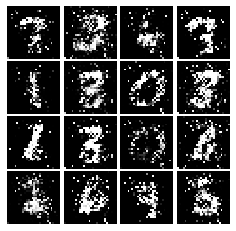

Epoch: 4, Iter: 2000, D: 0.2113, G:0.2299


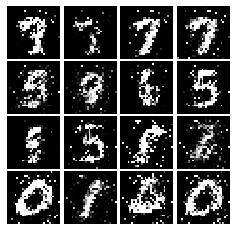

Epoch: 4, Iter: 2020, D: 0.1815, G:0.2102


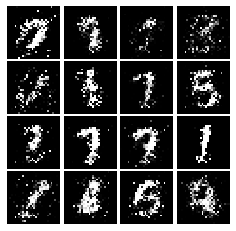

Epoch: 4, Iter: 2040, D: 0.2083, G:0.2413


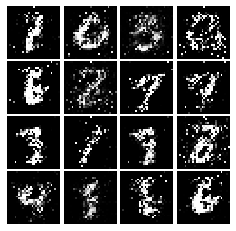

Epoch: 4, Iter: 2060, D: 0.2295, G:0.2107


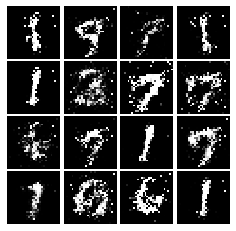

Epoch: 4, Iter: 2080, D: 0.2218, G:0.2136


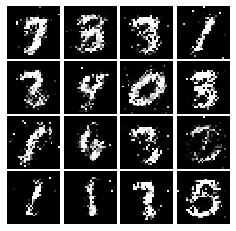

Epoch: 4, Iter: 2100, D: 0.2334, G:0.2


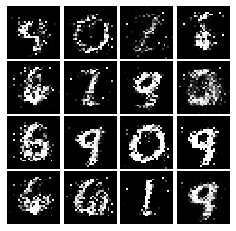

Epoch: 4, Iter: 2120, D: 0.1935, G:0.2094


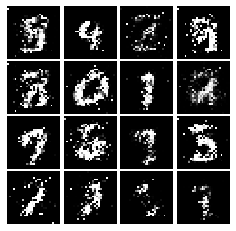

Epoch: 4, Iter: 2140, D: 0.2072, G:0.1763


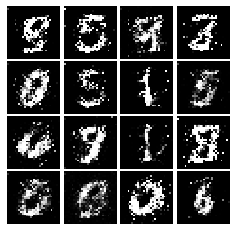

Epoch: 4, Iter: 2160, D: 0.2183, G:0.1442


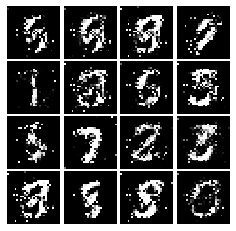

Epoch: 4, Iter: 2180, D: 0.2185, G:0.1522


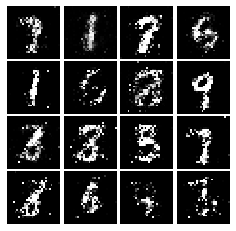

Epoch: 4, Iter: 2200, D: 0.1937, G:0.2494


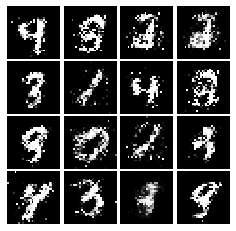

Epoch: 4, Iter: 2220, D: 0.2269, G:0.1995


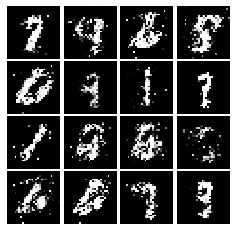

Epoch: 4, Iter: 2240, D: 0.2099, G:0.2275


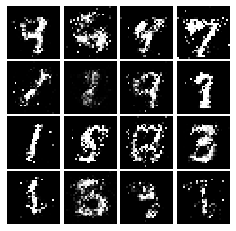

Epoch: 4, Iter: 2260, D: 0.2087, G:0.2258


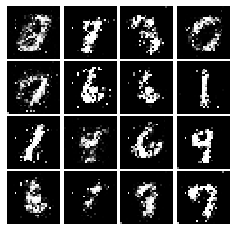

Epoch: 4, Iter: 2280, D: 0.2053, G:0.2437


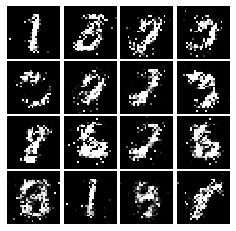

Epoch: 4, Iter: 2300, D: 0.2013, G:0.1822


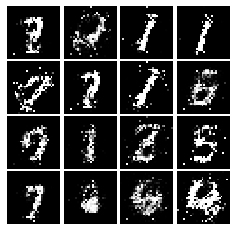

Epoch: 4, Iter: 2320, D: 0.2501, G:0.239


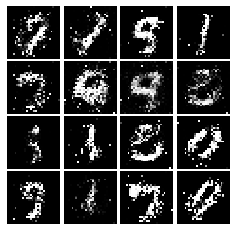

Epoch: 4, Iter: 2340, D: 0.1495, G:0.2533


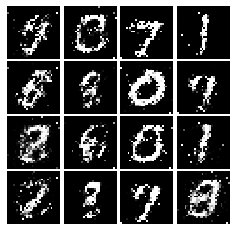

Epoch: 5, Iter: 2360, D: 0.2277, G:0.1645


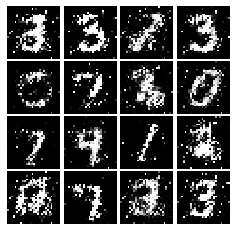

Epoch: 5, Iter: 2380, D: 0.202, G:0.2436


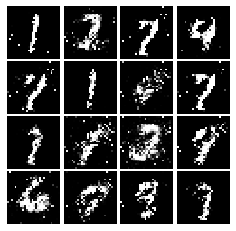

Epoch: 5, Iter: 2400, D: 0.2055, G:0.1945


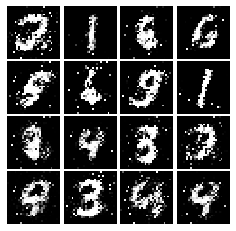

Epoch: 5, Iter: 2420, D: 0.2147, G:0.2092


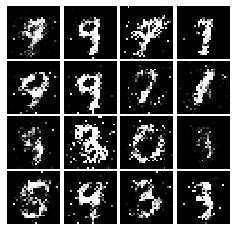

Epoch: 5, Iter: 2440, D: 0.1957, G:0.1962


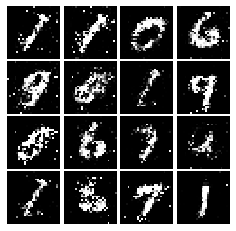

Epoch: 5, Iter: 2460, D: 0.186, G:0.2132


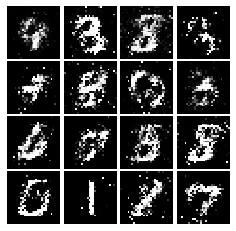

Epoch: 5, Iter: 2480, D: 0.2115, G:0.2034


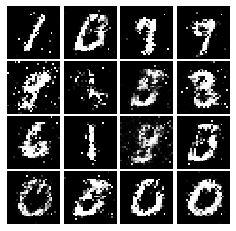

Epoch: 5, Iter: 2500, D: 0.1918, G:0.2129


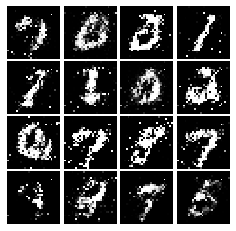

Epoch: 5, Iter: 2520, D: 0.2587, G:0.1452


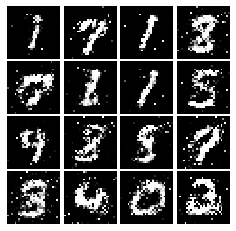

Epoch: 5, Iter: 2540, D: 0.2129, G:0.23


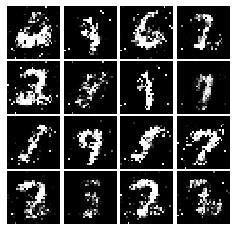

Epoch: 5, Iter: 2560, D: 0.2054, G:0.2012


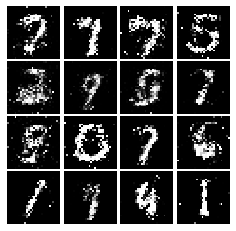

Epoch: 5, Iter: 2580, D: 0.2688, G:0.2136


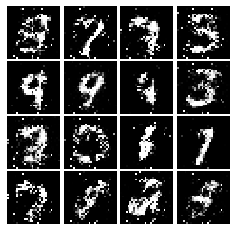

Epoch: 5, Iter: 2600, D: 0.2137, G:0.2217


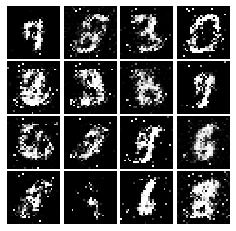

Epoch: 5, Iter: 2620, D: 0.1992, G:0.2085


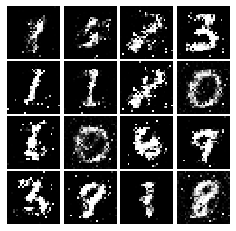

Epoch: 5, Iter: 2640, D: 0.2305, G:0.2017


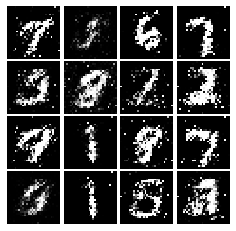

Epoch: 5, Iter: 2660, D: 0.2267, G:0.1845


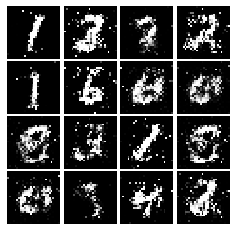

Epoch: 5, Iter: 2680, D: 0.2171, G:0.2017


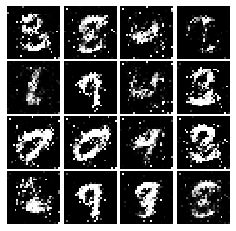

Epoch: 5, Iter: 2700, D: 0.2412, G:0.1867


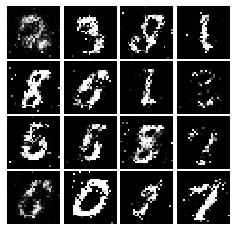

Epoch: 5, Iter: 2720, D: 0.2442, G:0.1889


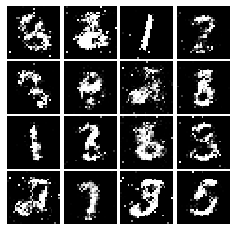

Epoch: 5, Iter: 2740, D: 0.2084, G:0.1851


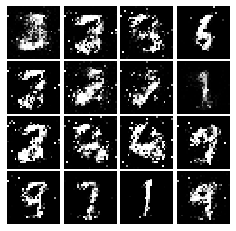

Epoch: 5, Iter: 2760, D: 0.2264, G:0.1782


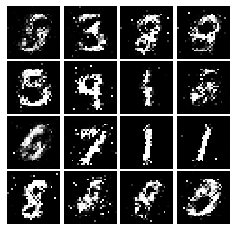

Epoch: 5, Iter: 2780, D: 0.207, G:0.2051


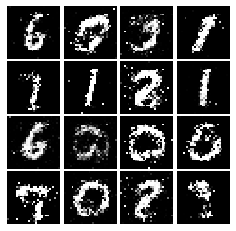

Epoch: 5, Iter: 2800, D: 0.1918, G:0.1769


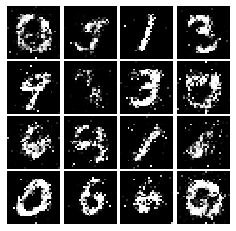

Epoch: 6, Iter: 2820, D: 0.2216, G:0.1905


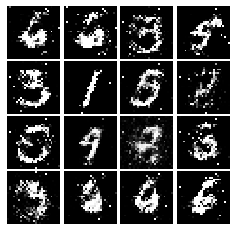

Epoch: 6, Iter: 2840, D: 0.2256, G:0.2019


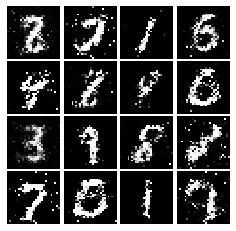

Epoch: 6, Iter: 2860, D: 0.2044, G:0.1813


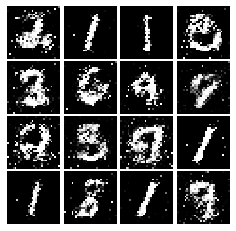

Epoch: 6, Iter: 2880, D: 0.2144, G:0.2127


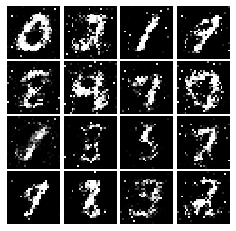

Epoch: 6, Iter: 2900, D: 0.213, G:0.2188


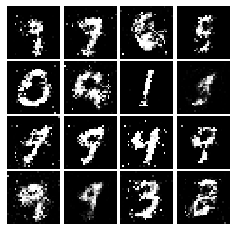

Epoch: 6, Iter: 2920, D: 0.2211, G:0.1568


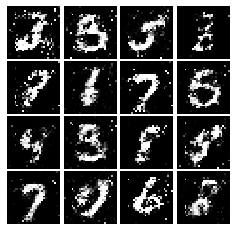

Epoch: 6, Iter: 2940, D: 0.2385, G:0.1562


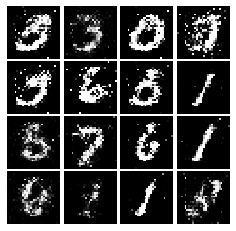

Epoch: 6, Iter: 2960, D: 0.2377, G:0.1713


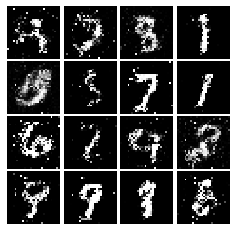

Epoch: 6, Iter: 2980, D: 0.2358, G:0.1685


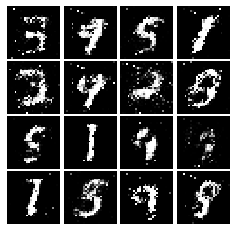

Epoch: 6, Iter: 3000, D: 0.2347, G:0.1659


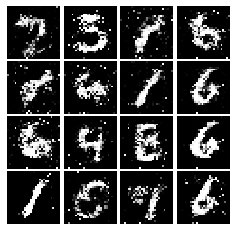

Epoch: 6, Iter: 3020, D: 0.2386, G:0.1643


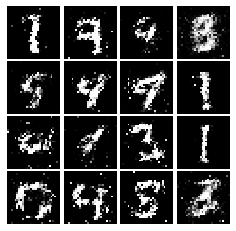

Epoch: 6, Iter: 3040, D: 0.2309, G:0.1817


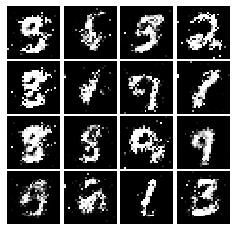

Epoch: 6, Iter: 3060, D: 0.2275, G:0.1643


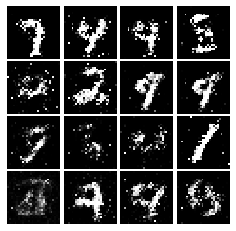

Epoch: 6, Iter: 3080, D: 0.2296, G:0.189


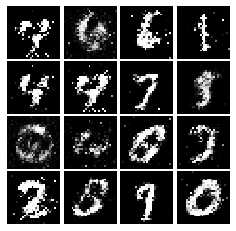

Epoch: 6, Iter: 3100, D: 0.2203, G:0.1698


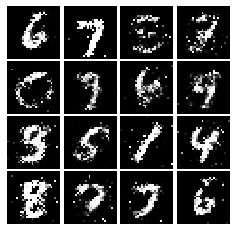

Epoch: 6, Iter: 3120, D: 0.2271, G:0.1371


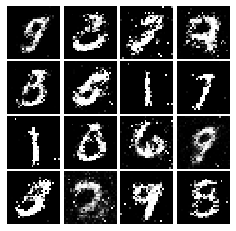

Epoch: 6, Iter: 3140, D: 0.2379, G:0.1637


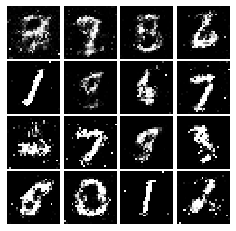

Epoch: 6, Iter: 3160, D: 0.2013, G:0.2022


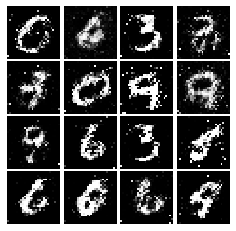

Epoch: 6, Iter: 3180, D: 0.2202, G:0.2006


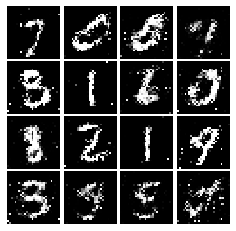

Epoch: 6, Iter: 3200, D: 0.2124, G:0.1825


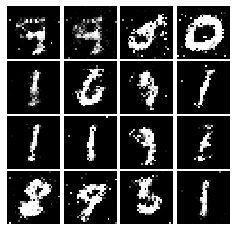

Epoch: 6, Iter: 3220, D: 0.2327, G:0.1625


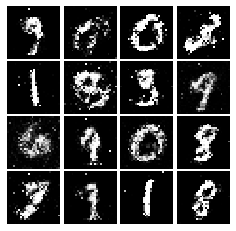

Epoch: 6, Iter: 3240, D: 0.2089, G:0.165


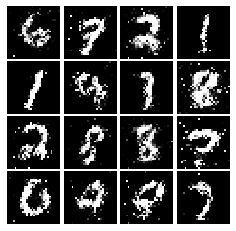

Epoch: 6, Iter: 3260, D: 0.2292, G:0.155


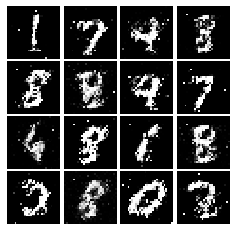

Epoch: 6, Iter: 3280, D: 0.2376, G:0.1623


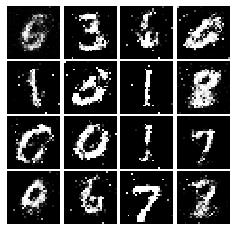

Epoch: 7, Iter: 3300, D: 0.2426, G:0.198


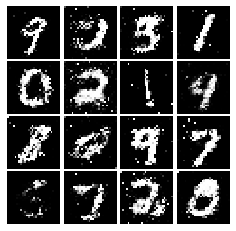

Epoch: 7, Iter: 3320, D: 0.2531, G:0.1633


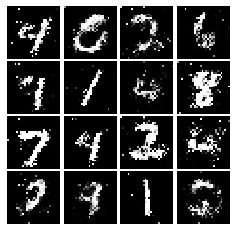

Epoch: 7, Iter: 3340, D: 0.2155, G:0.1966


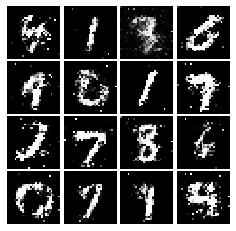

Epoch: 7, Iter: 3360, D: 0.2384, G:0.1525


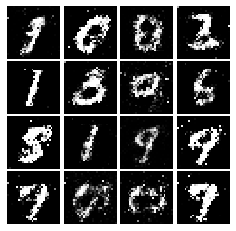

Epoch: 7, Iter: 3380, D: 0.2276, G:0.195


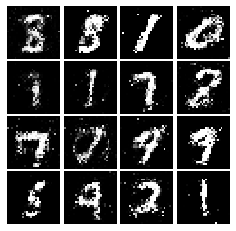

Epoch: 7, Iter: 3400, D: 0.2318, G:0.1397


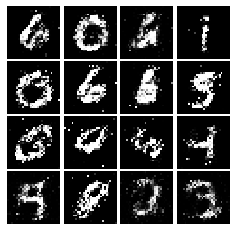

Epoch: 7, Iter: 3420, D: 0.2261, G:0.1757


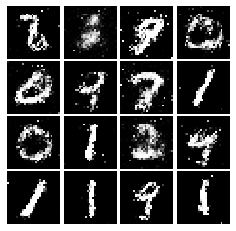

Epoch: 7, Iter: 3440, D: 0.2311, G:0.1377


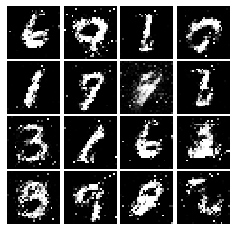

Epoch: 7, Iter: 3460, D: 0.2254, G:0.2002


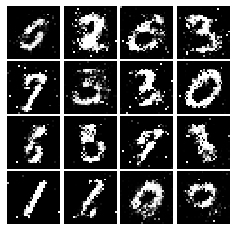

Epoch: 7, Iter: 3480, D: 0.2091, G:0.1612


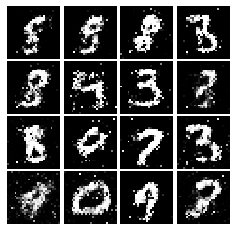

Epoch: 7, Iter: 3500, D: 0.237, G:0.1806


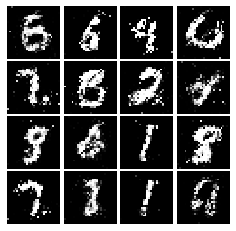

Epoch: 7, Iter: 3520, D: 0.2343, G:0.1506


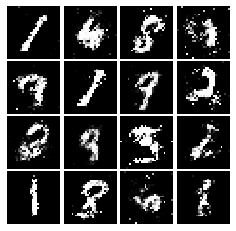

Epoch: 7, Iter: 3540, D: 0.2103, G:0.1926


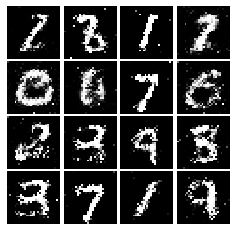

Epoch: 7, Iter: 3560, D: 0.2241, G:0.1733


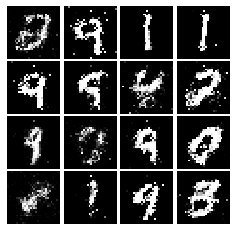

Epoch: 7, Iter: 3580, D: 0.2168, G:0.1733


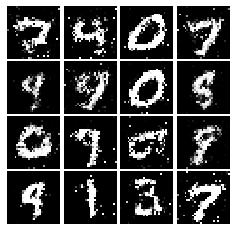

Epoch: 7, Iter: 3600, D: 0.2314, G:0.1971


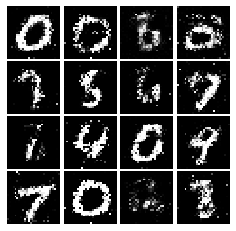

Epoch: 7, Iter: 3620, D: 0.2262, G:0.2018


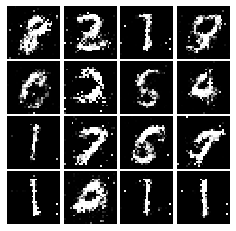

Epoch: 7, Iter: 3640, D: 0.2383, G:0.1653


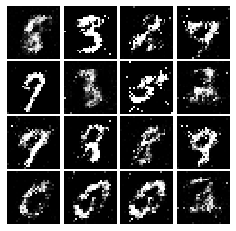

Epoch: 7, Iter: 3660, D: 0.2275, G:0.1511


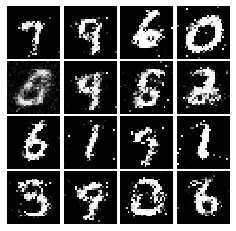

Epoch: 7, Iter: 3680, D: 0.2106, G:0.1722


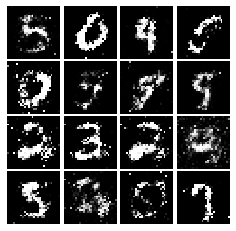

Epoch: 7, Iter: 3700, D: 0.2269, G:0.2003


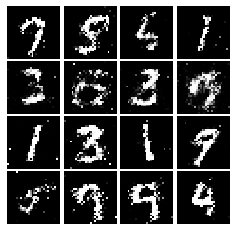

Epoch: 7, Iter: 3720, D: 0.2525, G:0.1812


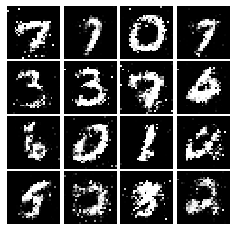

Epoch: 7, Iter: 3740, D: 0.2387, G:0.175


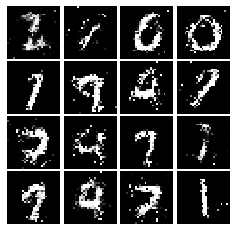

Epoch: 8, Iter: 3760, D: 0.2468, G:0.1885


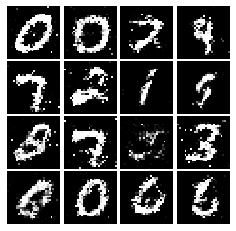

Epoch: 8, Iter: 3780, D: 0.2414, G:0.1822


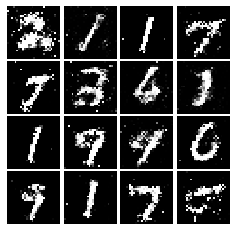

Epoch: 8, Iter: 3800, D: 0.2225, G:0.1755


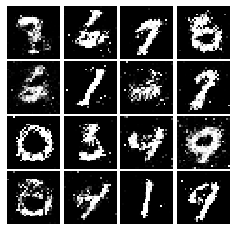

Epoch: 8, Iter: 3820, D: 0.2229, G:0.1608


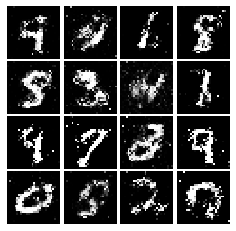

Epoch: 8, Iter: 3840, D: 0.2194, G:0.1552


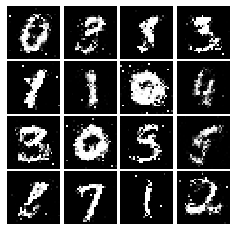

Epoch: 8, Iter: 3860, D: 0.2318, G:0.165


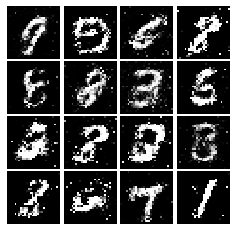

Epoch: 8, Iter: 3880, D: 0.2297, G:0.1566


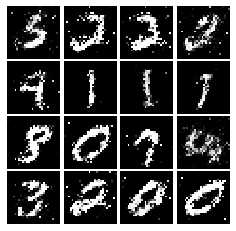

Epoch: 8, Iter: 3900, D: 0.2307, G:0.1408


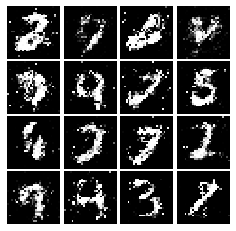

Epoch: 8, Iter: 3920, D: 0.2182, G:0.1695


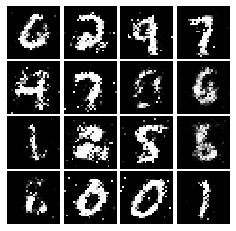

Epoch: 8, Iter: 3940, D: 0.2181, G:0.1601


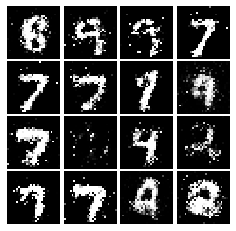

Epoch: 8, Iter: 3960, D: 0.2355, G:0.1487


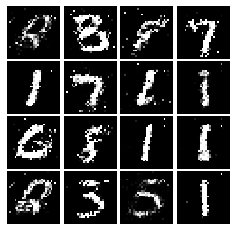

Epoch: 8, Iter: 3980, D: 0.2312, G:0.1581


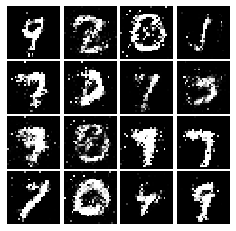

Epoch: 8, Iter: 4000, D: 0.2208, G:0.1786


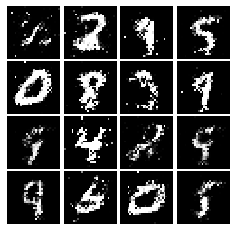

Epoch: 8, Iter: 4020, D: 0.2457, G:0.1573


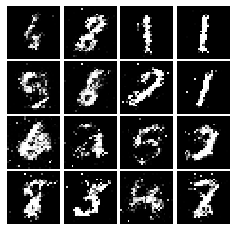

Epoch: 8, Iter: 4040, D: 0.2347, G:0.1732


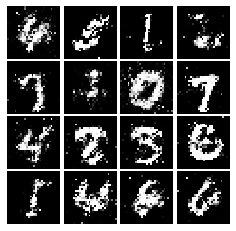

Epoch: 8, Iter: 4060, D: 0.2119, G:0.1971


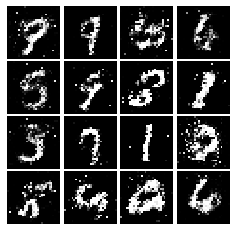

Epoch: 8, Iter: 4080, D: 0.2346, G:0.1526


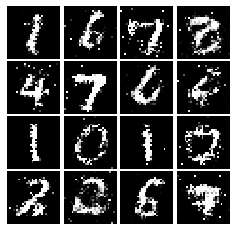

Epoch: 8, Iter: 4100, D: 0.2364, G:0.1747


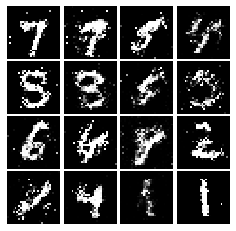

Epoch: 8, Iter: 4120, D: 0.232, G:0.1636


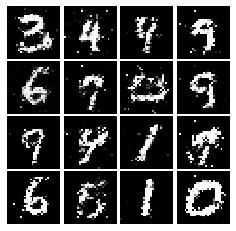

Epoch: 8, Iter: 4140, D: 0.2208, G:0.1894


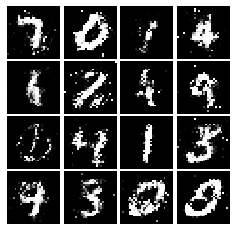

Epoch: 8, Iter: 4160, D: 0.2302, G:0.1637


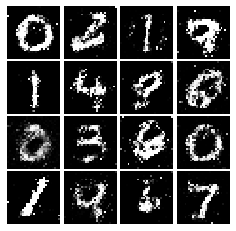

Epoch: 8, Iter: 4180, D: 0.2377, G:0.1787


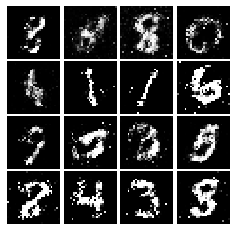

Epoch: 8, Iter: 4200, D: 0.2151, G:0.171


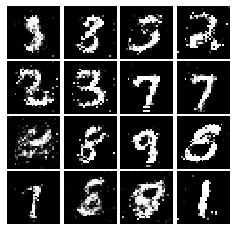

Epoch: 8, Iter: 4220, D: 0.219, G:0.1628


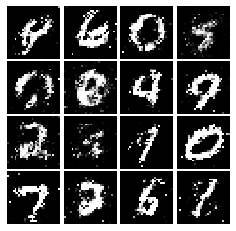

Epoch: 9, Iter: 4240, D: 0.2541, G:0.1865


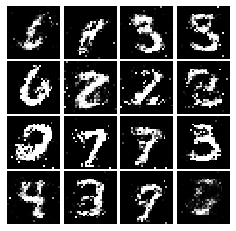

Epoch: 9, Iter: 4260, D: 0.2552, G:0.222


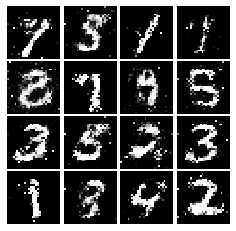

Epoch: 9, Iter: 4280, D: 0.2572, G:0.2329


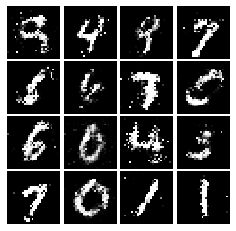

Epoch: 9, Iter: 4300, D: 0.2324, G:0.2034


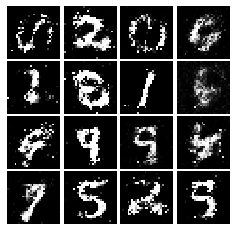

Epoch: 9, Iter: 4320, D: 0.2225, G:0.1993


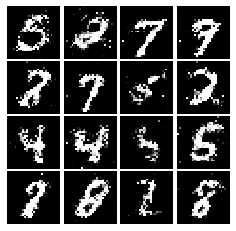

Epoch: 9, Iter: 4340, D: 0.2226, G:0.2141


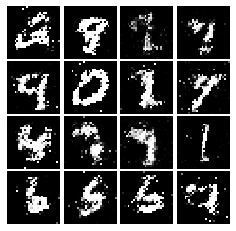

Epoch: 9, Iter: 4360, D: 0.2592, G:0.1933


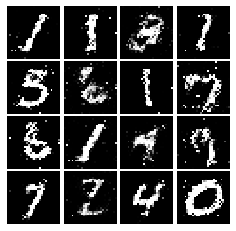

Epoch: 9, Iter: 4380, D: 0.2509, G:0.1403


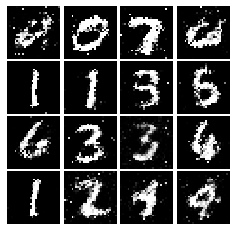

Epoch: 9, Iter: 4400, D: 0.2229, G:0.1761


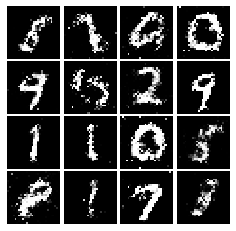

Epoch: 9, Iter: 4420, D: 0.2286, G:0.1863


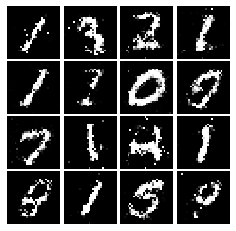

Epoch: 9, Iter: 4440, D: 0.2379, G:0.1792


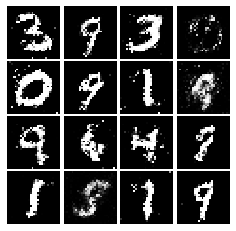

Epoch: 9, Iter: 4460, D: 0.2301, G:0.1709


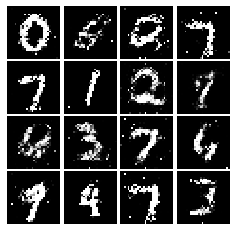

Epoch: 9, Iter: 4480, D: 0.2153, G:0.1747


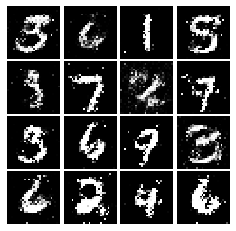

Epoch: 9, Iter: 4500, D: 0.2597, G:0.1502


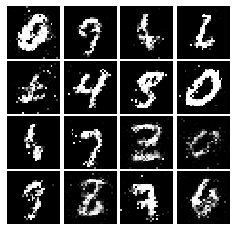

Epoch: 9, Iter: 4520, D: 0.2361, G:0.1565


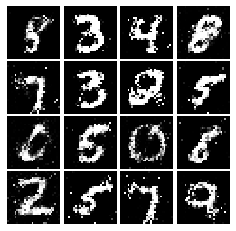

Epoch: 9, Iter: 4540, D: 0.2476, G:0.161


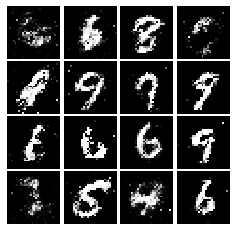

Epoch: 9, Iter: 4560, D: 0.2354, G:0.1524


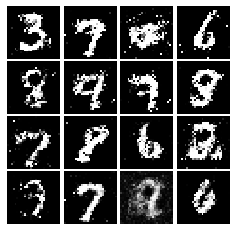

Epoch: 9, Iter: 4580, D: 0.2249, G:0.1677


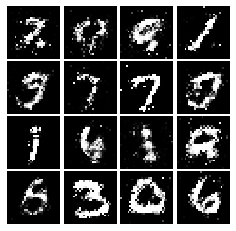

Epoch: 9, Iter: 4600, D: 0.2223, G:0.1542


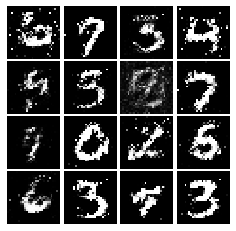

Epoch: 9, Iter: 4620, D: 0.2315, G:0.1512


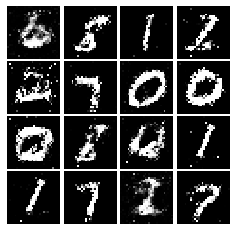

Epoch: 9, Iter: 4640, D: 0.2335, G:0.1847


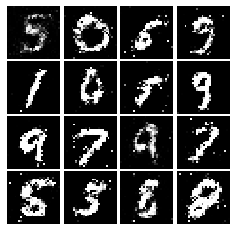

Epoch: 9, Iter: 4660, D: 0.2321, G:0.1571


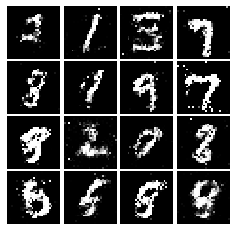

Epoch: 9, Iter: 4680, D: 0.2185, G:0.1817


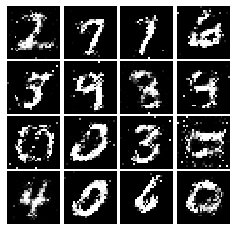

Final images


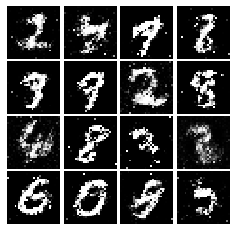

In [20]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, ls_discriminator_loss, ls_generator_loss)

# Deep Convolutional GANs
In the first part of the notebook, we implemented an almost direct copy of the original GAN network from Ian Goodfellow. However, this network architecture allows no real spatial reasoning. It is unable to reason about things like "sharp edges" in general because it lacks any convolutional layers. Thus, in this section, we will implement some of the ideas from [DCGAN](https://arxiv.org/abs/1511.06434), where we use convolutional networks as our discriminators and generators.

#### Discriminator
We will use a discriminator inspired by the TensorFlow MNIST classification [tutorial](https://www.tensorflow.org/get_started/mnist/pros), which is able to get above 99% accuracy on the MNIST dataset fairly quickly. *Be sure to check the dimensions of x and reshape when needed*, fully connected blocks expect [N,D] Tensors while conv2d blocks expect [N,H,W,C] Tensors. Please use `tf.keras.layers` to define the following architecture:

Architecture:
* Conv2D: 32 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Conv2D: 64 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Flatten
* Fully Connected with output size 4 x 4 x 64
* Leaky ReLU(alpha=0.01)
* Fully Connected with output size 1

Once again, please use biases for all convolutional and fully connected layers, and use the default parameter initializers. Note that a padding of 0 can be accomplished with the 'VALID' padding option.

In [21]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.InputLayer(784),
        tf.keras.layers.Reshape((28,28,1)),
        tf.keras.layers.Conv2D(32,(5,5),strides = 1,padding = 'VALID'),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.MaxPool2D((2,2),strides = 2),
        tf.keras.layers.Conv2D(64,(5,5),strides = 1,padding = 'VALID'),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.MaxPool2D((2,2),strides = 2),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(4*4*64),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.Dense(1)
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

model = discriminator()
test_discriminator(1102721)

Correct number of parameters in discriminator.


#### Generator
For the generator, we will copy the architecture exactly from the [InfoGAN paper](https://arxiv.org/pdf/1606.03657.pdf). See Appendix C.1 MNIST. Please use `tf.keras.layers` for your implementation. You might find the documentation for [tf.keras.layers.Conv2DTranspose](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/layers/Conv2DTranspose) useful. The architecture is as follows.

Architecture:
* Fully connected with output size 1024 
* `ReLU`
* BatchNorm
* Fully connected with output size 7 x 7 x 128 
* `ReLU`
* BatchNorm
* Resize into Image Tensor of size 7, 7, 128
* Conv2D^T (transpose): 64 filters of 4x4, stride 2
* `ReLU`
* BatchNorm
* Conv2d^T (transpose): 1 filter of 4x4, stride 2
* `TanH`

Once again, use biases for the fully connected and transpose convolutional layers. Please use the default initializers for your parameters. For padding, choose the 'same' option for transpose convolutions. For Batch Normalization, assume we are always in 'training' mode.

In [22]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
    # TODO: implement architecture
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    tf.keras.layers.InputLayer(noise_dim),
    tf.keras.layers.Dense(1024,activation = 'relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dense(7*7*128,activation = 'relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Reshape((7,7,128)),
    tf.keras.layers.Conv2DTranspose(filters=64,kernel_size=(4,4),strides = 2,activation = tf.nn.relu,padding = 'SAME'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2DTranspose(filters=1,kernel_size=(4,4),strides = 2,activation = tf.tanh,padding = 'SAME')
    ])
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return model
test_generator(6595521)

Correct number of parameters in generator.


We have to recreate our network since we've changed our functions.

### Train and evaluate a DCGAN
This is the one part of A3 that significantly benefits from using a GPU. It takes 3 minutes on a GPU for the requested five epochs. Or about 50 minutes on a dual core laptop on CPU (feel free to use 3 epochs if you do it on CPU).

Epoch: 0, Iter: 0, D: 1.427, G:0.6503


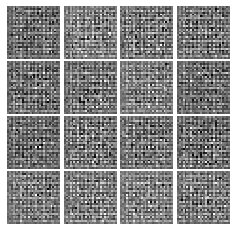

Epoch: 0, Iter: 20, D: 0.1571, G:2.308


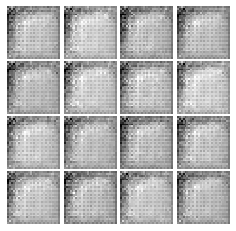

Epoch: 0, Iter: 40, D: 0.003053, G:5.891


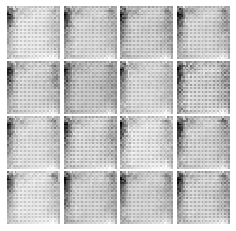

Epoch: 0, Iter: 60, D: 0.00127, G:6.835


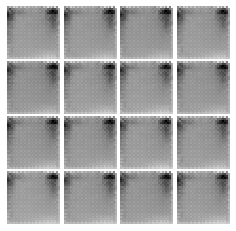

Epoch: 0, Iter: 80, D: 0.3472, G:1.524


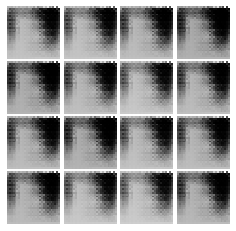

Epoch: 0, Iter: 100, D: 2.723, G:3.652


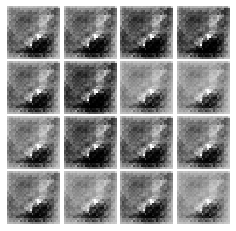

Epoch: 0, Iter: 120, D: 0.4985, G:3.56


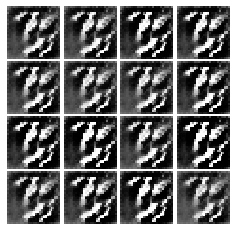

Epoch: 0, Iter: 140, D: 0.5429, G:3.575


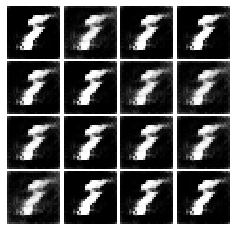

Epoch: 0, Iter: 160, D: 0.5913, G:2.533


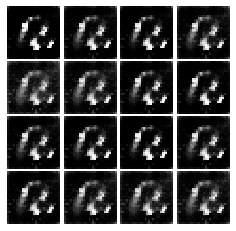

Epoch: 0, Iter: 180, D: 0.5985, G:3.607


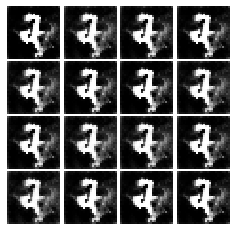

Epoch: 0, Iter: 200, D: 0.2778, G:4.09


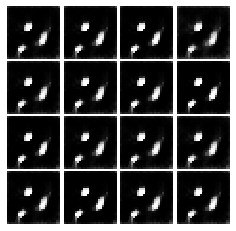

Epoch: 0, Iter: 220, D: 0.4425, G:1.677


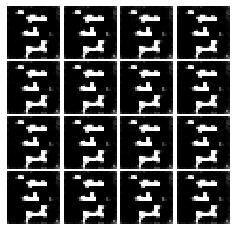

Epoch: 0, Iter: 240, D: 0.1053, G:4.548


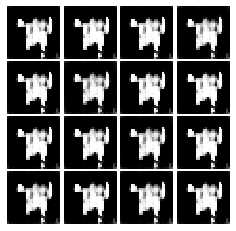

Epoch: 0, Iter: 260, D: 0.01914, G:5.183


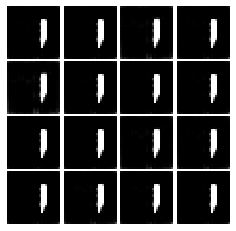

Epoch: 0, Iter: 280, D: 0.7349, G:1.804


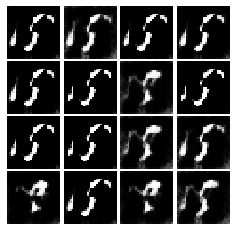

Epoch: 0, Iter: 300, D: 0.6602, G:2.793


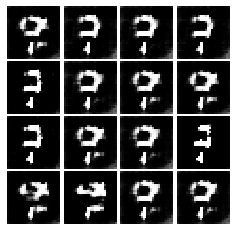

Epoch: 0, Iter: 320, D: 0.8103, G:1.871


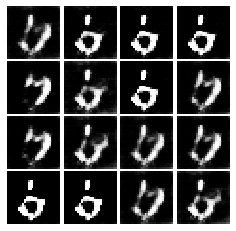

Epoch: 0, Iter: 340, D: 0.9117, G:2.496


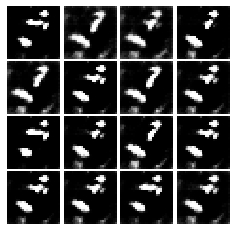

Epoch: 0, Iter: 360, D: 0.6393, G:2.573


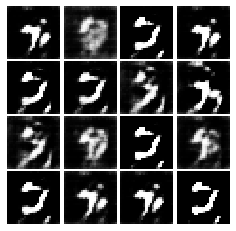

Epoch: 0, Iter: 380, D: 0.6157, G:0.924


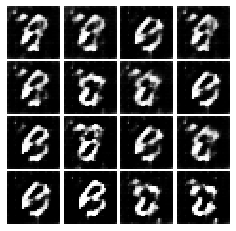

Epoch: 0, Iter: 400, D: 0.4803, G:2.742


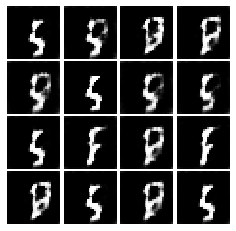

Epoch: 0, Iter: 420, D: 0.7192, G:3.708


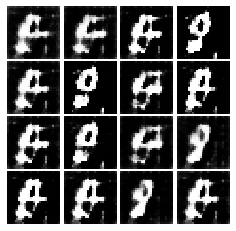

Epoch: 0, Iter: 440, D: 0.8411, G:3.517


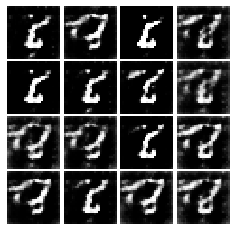

Epoch: 0, Iter: 460, D: 0.6613, G:2.46


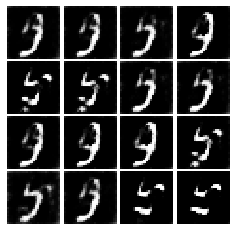

Epoch: 1, Iter: 480, D: 0.4855, G:3.754


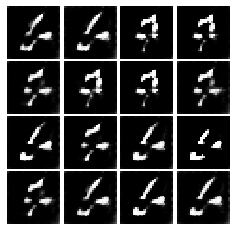

Epoch: 1, Iter: 500, D: 0.4243, G:2.35


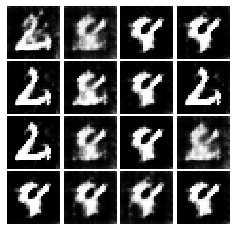

Epoch: 1, Iter: 520, D: 0.2917, G:3.644


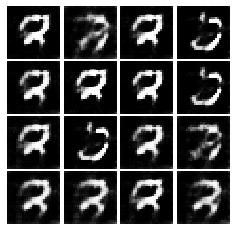

Epoch: 1, Iter: 540, D: 1.057, G:0.7944


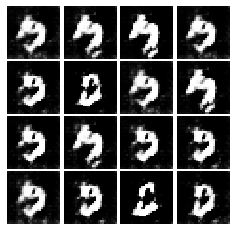

Epoch: 1, Iter: 560, D: 0.5357, G:4.1


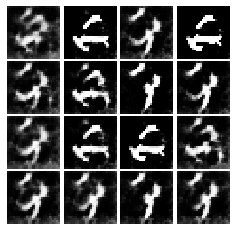

Epoch: 1, Iter: 580, D: 0.6564, G:3.402


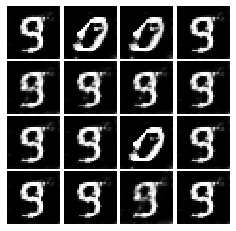

Epoch: 1, Iter: 600, D: 0.416, G:3.432


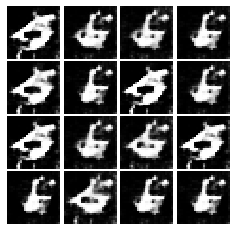

Epoch: 1, Iter: 620, D: 0.3604, G:3.082


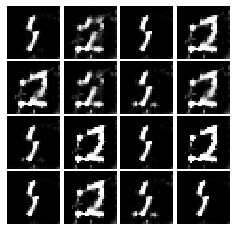

Epoch: 1, Iter: 640, D: 0.42, G:2.913


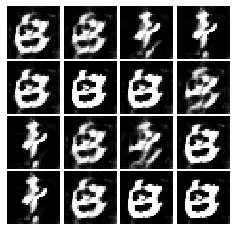

Epoch: 1, Iter: 660, D: 0.9934, G:2.911


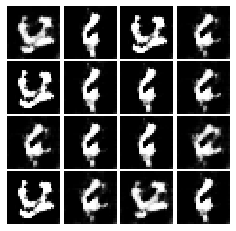

Epoch: 1, Iter: 680, D: 1.241, G:4.828


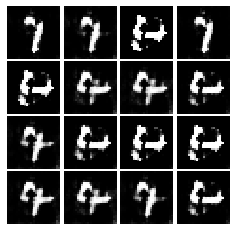

Epoch: 1, Iter: 700, D: 0.4526, G:3.129


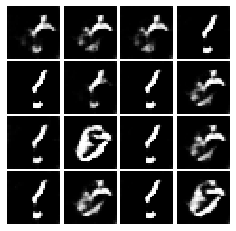

Epoch: 1, Iter: 720, D: 0.4946, G:2.907


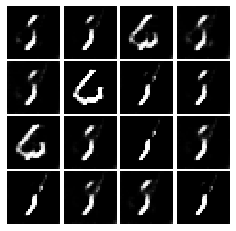

Epoch: 1, Iter: 740, D: 0.5638, G:1.413


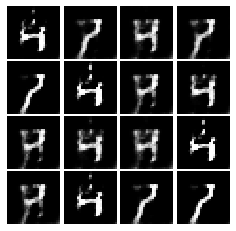

Epoch: 1, Iter: 760, D: 0.7523, G:3.077


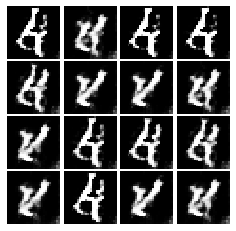

Epoch: 1, Iter: 780, D: 0.4253, G:5.12


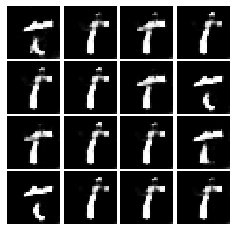

Epoch: 1, Iter: 800, D: 0.2771, G:4.762


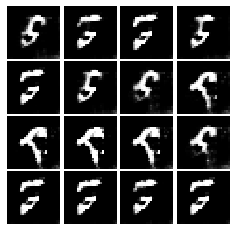

Epoch: 1, Iter: 820, D: 0.8334, G:2.944


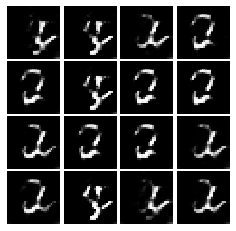

Epoch: 1, Iter: 840, D: 0.6904, G:2.321


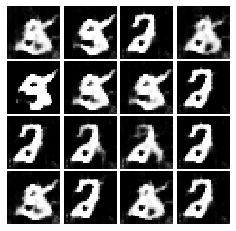

Epoch: 1, Iter: 860, D: 0.1689, G:3.272


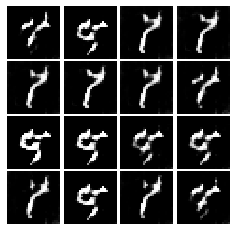

Epoch: 1, Iter: 880, D: 0.4957, G:3.34


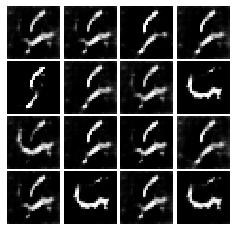

Epoch: 1, Iter: 900, D: 0.8289, G:2.851


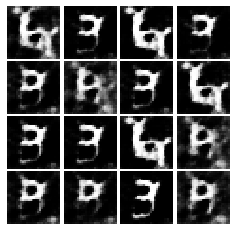

Epoch: 1, Iter: 920, D: 1.246, G:1.788


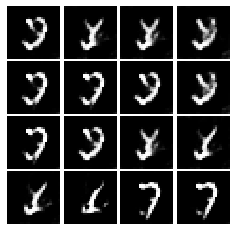

Epoch: 2, Iter: 940, D: 0.3923, G:3.176


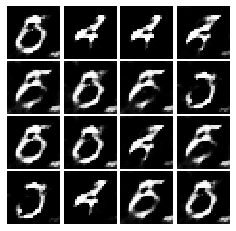

Epoch: 2, Iter: 960, D: 0.9142, G:2.986


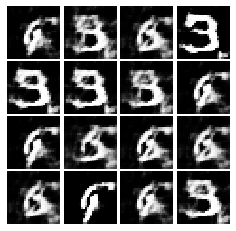

Epoch: 2, Iter: 980, D: 0.4576, G:3.032


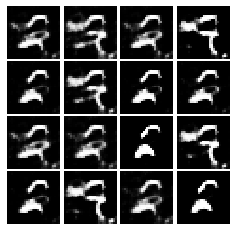

Epoch: 2, Iter: 1000, D: 1.08, G:2.527


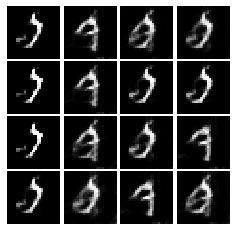

Epoch: 2, Iter: 1020, D: 0.6043, G:2.545


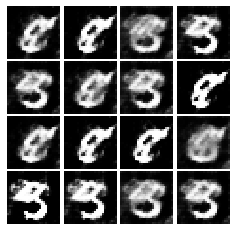

Epoch: 2, Iter: 1040, D: 0.3184, G:3.01


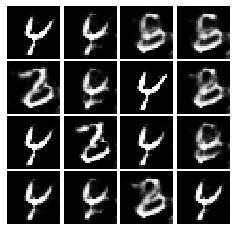

Epoch: 2, Iter: 1060, D: 0.3693, G:2.74


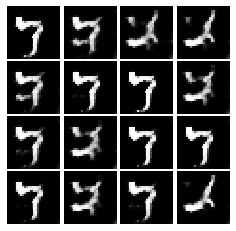

Epoch: 2, Iter: 1080, D: 0.1533, G:4.054


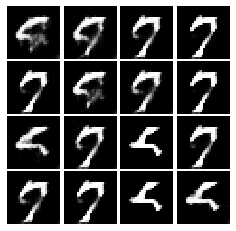

Epoch: 2, Iter: 1100, D: 0.4716, G:3.778


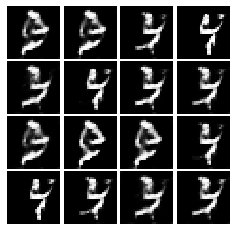

Epoch: 2, Iter: 1120, D: 0.4482, G:3.473


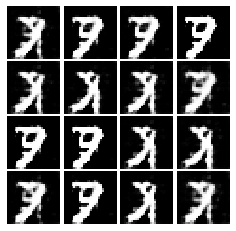

Epoch: 2, Iter: 1140, D: 0.201, G:3.617


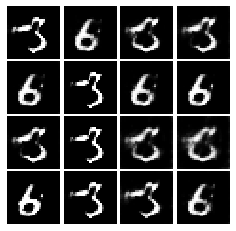

Epoch: 2, Iter: 1160, D: 0.623, G:3.223


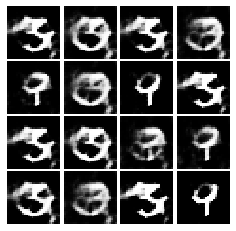

Epoch: 2, Iter: 1180, D: 0.2726, G:3.483


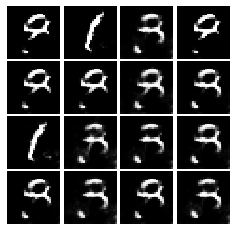

Epoch: 2, Iter: 1200, D: 0.3939, G:2.311


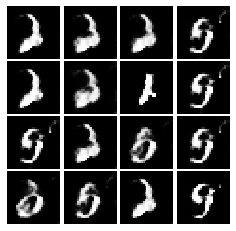

Epoch: 2, Iter: 1220, D: 0.3275, G:2.653


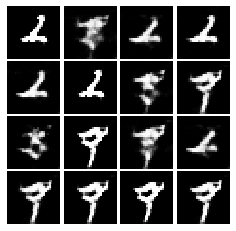

Epoch: 2, Iter: 1240, D: 0.4767, G:7.903


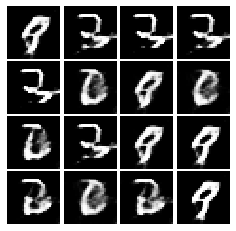

Epoch: 2, Iter: 1260, D: 0.2682, G:2.592


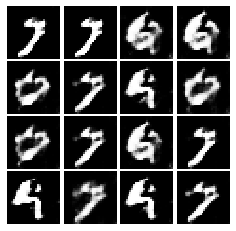

Epoch: 2, Iter: 1280, D: 0.2112, G:3.145


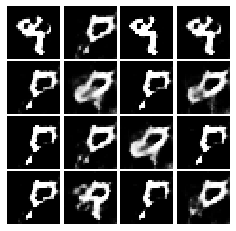

Epoch: 2, Iter: 1300, D: 0.1232, G:4.082


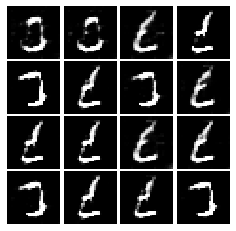

Epoch: 2, Iter: 1320, D: 0.3892, G:3.987


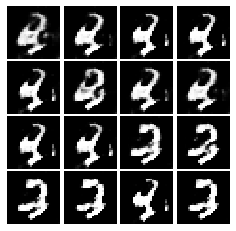

Epoch: 2, Iter: 1340, D: 0.04708, G:5.652


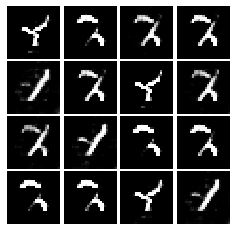

Epoch: 2, Iter: 1360, D: 0.2375, G:3.827


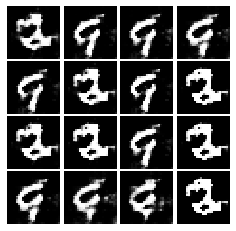

Epoch: 2, Iter: 1380, D: 0.2207, G:4.292


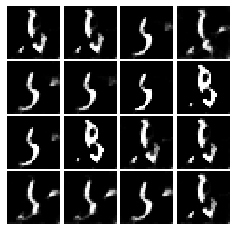

Epoch: 2, Iter: 1400, D: 0.1356, G:4.542


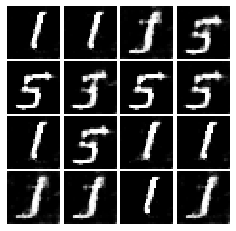

Epoch: 3, Iter: 1420, D: 0.2625, G:3.52


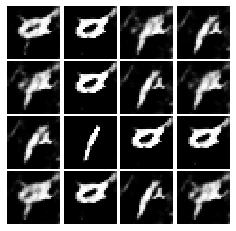

Epoch: 3, Iter: 1440, D: 0.5173, G:3.337


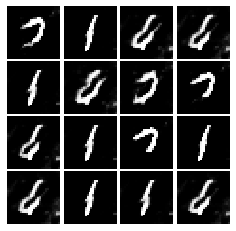

Epoch: 3, Iter: 1460, D: 0.9642, G:3.064


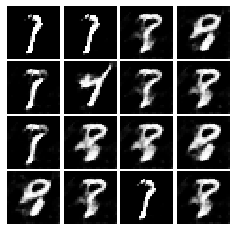

Epoch: 3, Iter: 1480, D: 0.4005, G:3.772


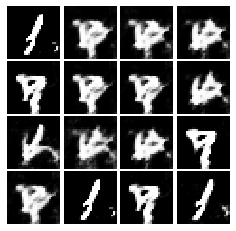

Epoch: 3, Iter: 1500, D: 0.357, G:3.673


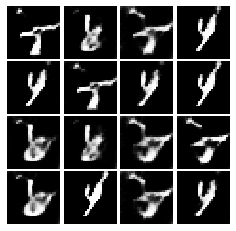

Epoch: 3, Iter: 1520, D: 0.2532, G:3.463


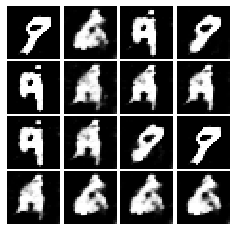

Epoch: 3, Iter: 1540, D: 0.3532, G:2.931


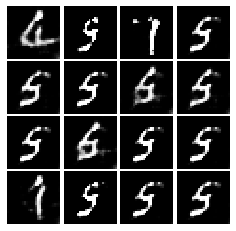

Epoch: 3, Iter: 1560, D: 0.2316, G:3.378


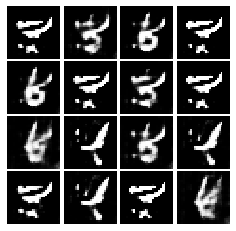

Epoch: 3, Iter: 1580, D: 3.853, G:2.7


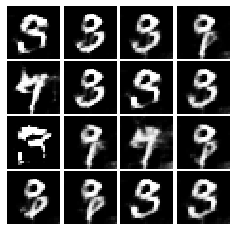

Epoch: 3, Iter: 1600, D: 0.3274, G:3.512


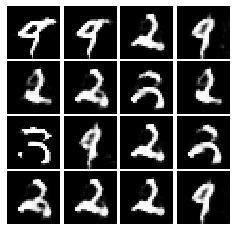

Epoch: 3, Iter: 1620, D: 0.3274, G:4.544


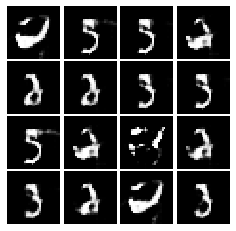

Epoch: 3, Iter: 1640, D: 0.2163, G:3.612


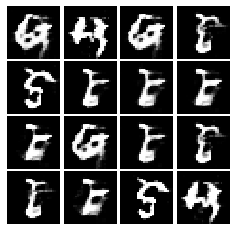

Epoch: 3, Iter: 1660, D: 0.5213, G:1.866


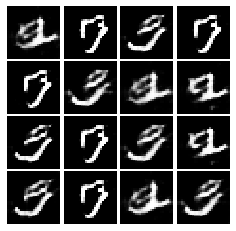

Epoch: 3, Iter: 1680, D: 0.4485, G:2.576


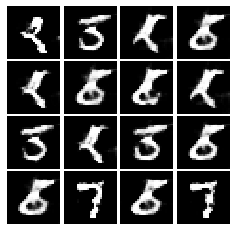

Epoch: 3, Iter: 1700, D: 0.5621, G:2.898


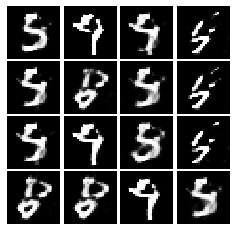

Epoch: 3, Iter: 1720, D: 0.3852, G:4.236


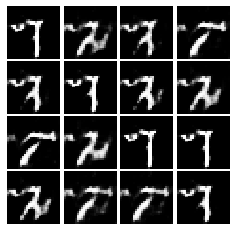

Epoch: 3, Iter: 1740, D: 0.4349, G:2.837


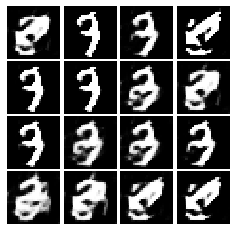

Epoch: 3, Iter: 1760, D: 0.8592, G:9.49


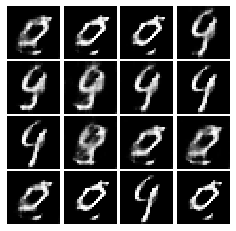

Epoch: 3, Iter: 1780, D: 0.6225, G:5.129


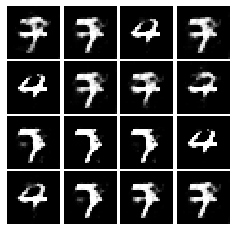

Epoch: 3, Iter: 1800, D: 0.657, G:3.97


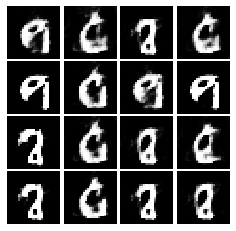

Epoch: 3, Iter: 1820, D: 0.6677, G:11.66


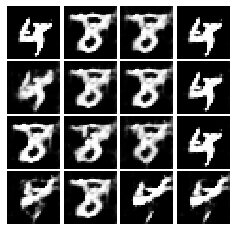

Epoch: 3, Iter: 1840, D: 0.4861, G:3.02


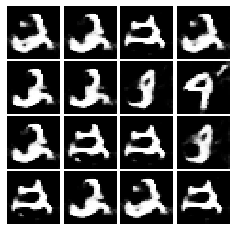

Epoch: 3, Iter: 1860, D: 0.569, G:4.291


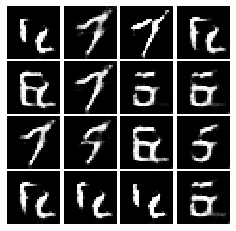

Epoch: 4, Iter: 1880, D: 0.4636, G:3.805


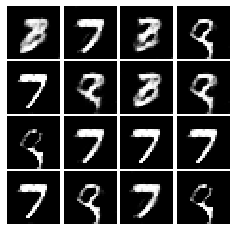

Epoch: 4, Iter: 1900, D: 0.3145, G:3.165


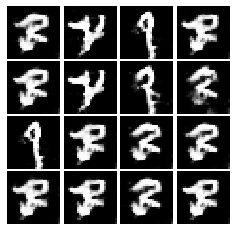

Epoch: 4, Iter: 1920, D: 0.8757, G:6.063


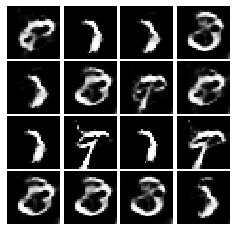

Epoch: 4, Iter: 1940, D: 0.8875, G:4.819


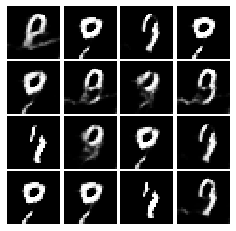

Epoch: 4, Iter: 1960, D: 0.251, G:3.679


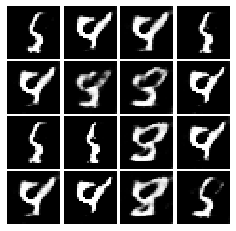

Epoch: 4, Iter: 1980, D: 0.286, G:3.65


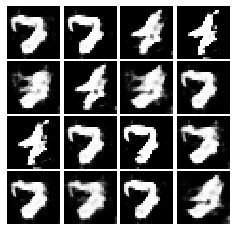

Epoch: 4, Iter: 2000, D: 3.625, G:3.088


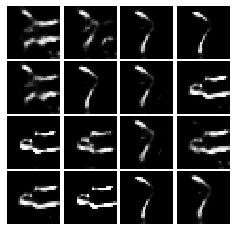

Epoch: 4, Iter: 2020, D: 0.3991, G:4.649


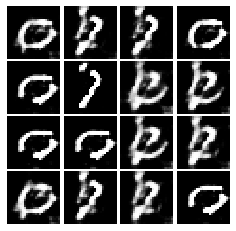

Epoch: 4, Iter: 2040, D: 0.2121, G:3.575


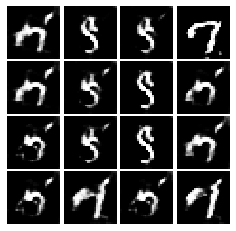

Epoch: 4, Iter: 2060, D: 0.4903, G:4.541


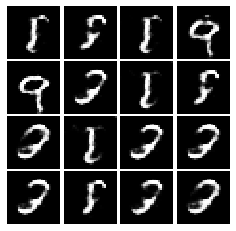

Epoch: 4, Iter: 2080, D: 0.4539, G:2.75


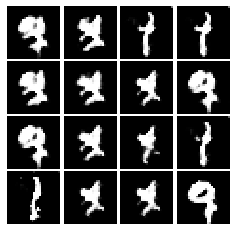

Epoch: 4, Iter: 2100, D: 0.2851, G:3.871


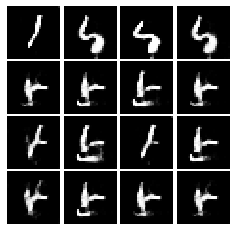

Epoch: 4, Iter: 2120, D: 0.3773, G:3.636


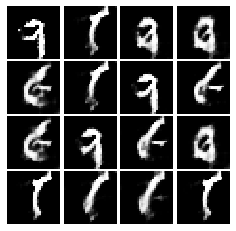

Epoch: 4, Iter: 2140, D: 0.7173, G:5.796


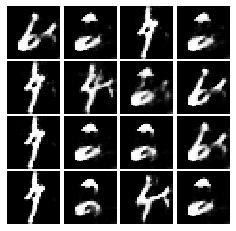

Epoch: 4, Iter: 2160, D: 8.357, G:6.04


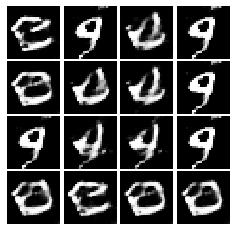

Epoch: 4, Iter: 2180, D: 0.5898, G:3.248


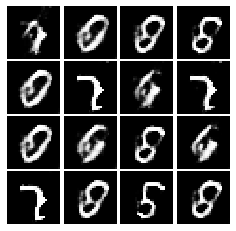

Epoch: 4, Iter: 2200, D: 0.9635, G:4.192


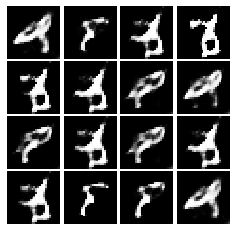

Epoch: 4, Iter: 2220, D: 0.4647, G:2.813


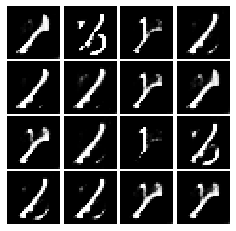

Epoch: 4, Iter: 2240, D: 0.1405, G:4.971


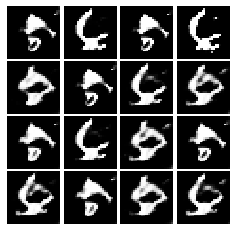

Epoch: 4, Iter: 2260, D: 0.3772, G:6.982


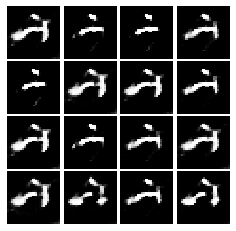

Epoch: 4, Iter: 2280, D: 0.4213, G:4.502


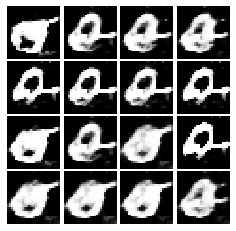

Epoch: 4, Iter: 2300, D: 0.4139, G:3.688


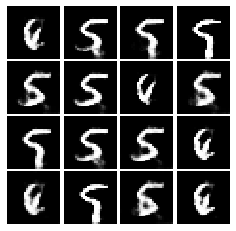

Epoch: 4, Iter: 2320, D: 0.1832, G:4.682


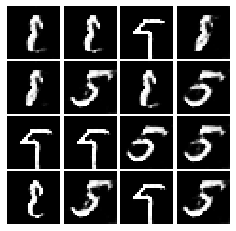

Epoch: 4, Iter: 2340, D: 0.7701, G:4.915


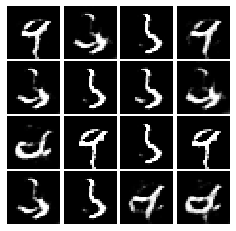

Final images


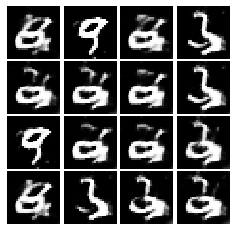

In [23]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss, num_epochs=5)